In [69]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import seaborn as sns
from matplotlib.lines import Line2D
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

from matplotlib.offsetbox import AnchoredText
ccolors = plt.rcParams['axes.prop_cycle'].by_key()['color']
plt.rcParams.update({'font.size': 16})

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib import colors

from concorde.tools import ssScale
import geopandas as gpd
import geopy.distance

from sklearn.model_selection import train_test_split

## histograms

In [70]:
pin = Path(r'../models/NNmodel/inputs/random_split')
ytrain = np.load(pin/'y_train.npy')
ytest = np.load(pin/'y_test.npy')
ytrainAug = np.load(pin/'y_train_augmentedAllX50_ALL.npy')
ytestAug = np.load(pin/'y_test_augmentedAllX50_ALL.npy')

In [5]:
## read outputs
pathin = Path(r'../models/adcirc/concorde/batch02/_postprocessing/_preprocessForNN')
dfout = pd.read_csv(pathin.parent/'max_water_level_at_NC_NC_estuaries.csv', index_col = 0)
dfout = dfout.sort_index()
arrOut = dfout.values.reshape((dfout.shape[0], dfout.shape[1], 1))
ytrainEst, ytestEst = train_test_split(arrOut, test_size=0.15, random_state=42, shuffle=True)
ytest2 = np.concatenate([ytest, ytestEst], axis = 1)
ytrain2 = np.concatenate([ytrain, ytrainEst], axis = 1)

In [6]:
# stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
# alpha = 1
# fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3, sharex = True, sharey = True)
# for i in range(6):
#     print(stations[i])
#     axi = axs.flatten()[i]
#     print(f'    max ytrain: {np.max(ytrain[:, i, 0]):0.2f}')
#     sns.kdeplot(ytrain[:, i, 0], ax = axi, alpha = alpha)
#     print(f'    max ytest: {np.max(ytest[:, i, 0]):0.2f}')
#     sns.kdeplot(ytest[:, i, 0], ax = axi, color = ccolors[1], alpha = alpha)
#     print(f'    max ytrainAug: {np.max(ytrainAug[:, i, 0]):0.2f}')
#     sns.kdeplot(ytrainAug[:, i, 0], ax = axi, color = ccolors[2], alpha = alpha)
#     print(f'    max ytestAug: {np.max(ytestAug[:, i, 0]):0.2f}')
#     sns.kdeplot(ytestAug[:, i, 0], ax = axi, color = ccolors[3], alpha = alpha)
#     axi.set_title(stations[i])
#     axi.grid(True)
#     axi.set_ylim([-0.1, 5.1])

# axs[0, 0].legend(['Train', 'Test', 'Train aug.', 'Test aug.'], frameon = True)
# axs[0, 0].set_ylabel('Density [-]')
# axs[1, 0].set_ylabel('Density [-]')
# axs[1, 0].set_xlabel('Total water level [mMSL]')
# axs[1, 1].set_xlabel('Total water level [mMSL]')
# axs[1, 2].set_xlabel('Total water level [mMSL]')
# fig.savefig(r'../documents/thesis/histograms.png', dpi = 300, bbox_inches = 'tight')

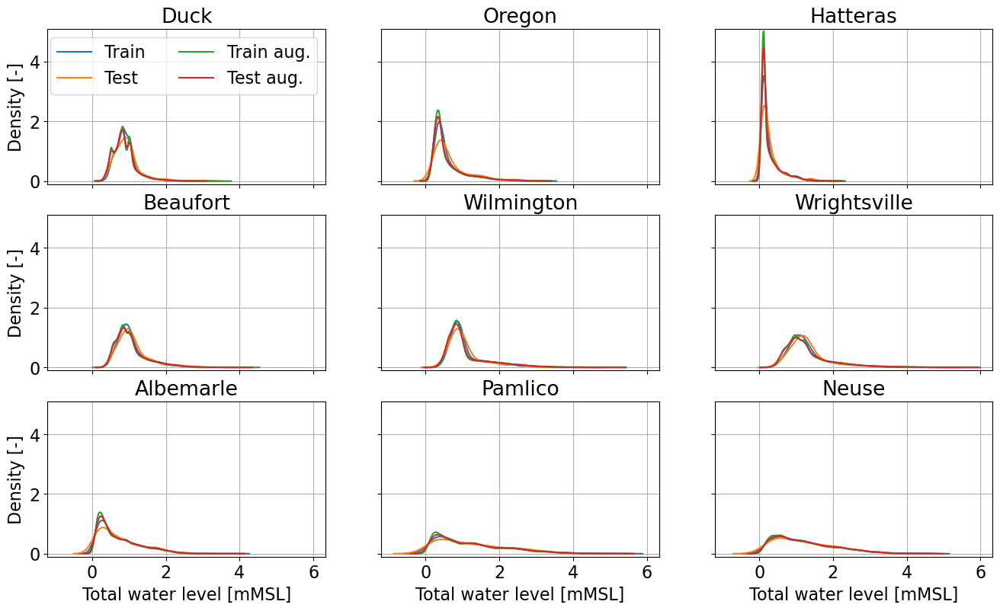

In [10]:
with plt.rc_context({'font.size': 16}):
    stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    alpha = 1
    fig, axs = plt.subplots(figsize = (16, 9), nrows = 3, ncols = 3, sharex = True, sharey = True)
    for i in range(9):
        # print(stations[i])
        axi = axs.flatten()[i]
        # print(f'    max ytrain: {np.max(ytrain2[:, i, 0]):0.2f}')
        sns.kdeplot(ytrain2[:, i, 0], ax = axi, alpha = alpha)
        # print(f'    max ytest: {np.max(ytest2[:, i, 0]):0.2f}')
        sns.kdeplot(ytest2[:, i, 0], ax = axi, color = ccolors[1], alpha = alpha)
        # print(f'    max ytrainAug: {np.max(ytrainAug[:, i, 0]):0.2f}')
        sns.kdeplot(ytrainAug[:, i, 0], ax = axi, color = ccolors[2], alpha = alpha)
        # print(f'    max ytestAug: {np.max(ytestAug[:, i, 0]):0.2f}')
        sns.kdeplot(ytestAug[:, i, 0], ax = axi, color = ccolors[3], alpha = alpha)
        axi.set_title(stations[i])
        axi.grid(True)
        axi.set_ylim([-0.1, 5.1])

    axs[0, 0].legend(['Train', 'Test', 'Train aug.', 'Test aug.'], frameon = True, ncol = 2)
    axs[0, 0].set_ylabel('Density [-]')
    axs[1, 0].set_ylabel('Density [-]')
    axs[2, 0].set_ylabel('Density [-]')
    axs[2, 0].set_xlabel('Total water level [mMSL]')
    axs[2, 1].set_xlabel('Total water level [mMSL]')
    axs[2, 2].set_xlabel('Total water level [mMSL]')
    fig.savefig(r'../documents/defense/histograms_r1.png', dpi = 300, bbox_inches = 'tight')

In [3]:
pin = Path(r'../models/NNmodel/inputs/random_split')
ytrainAug0 = np.load(pin/'y_train_augmentedAllX50_def.npy')
ytestAug0 = np.load(pin/'y_test_augmentedAllX50_def.npy')

ytrainAug1 = np.load(pin/'y_train_augmentedSurgeAbove10perX50.npy')
ytestAug1 = np.load(pin/'y_test_augmentedSurgeAbove10perX50.npy')

ytrainAug2 = np.load(pin/'y_train_augHighTideX25.npy')
ytestAug2 = np.load(pin/'y_test_augHighTideX25.npy')

In [9]:
yAug0 = np.concatenate([ytrainAug0, ytestAug0])
yAug1 = np.concatenate([ytrainAug1, ytestAug1])
yAug2 = np.concatenate([ytrainAug2, ytestAug2])

Duck
    max yAug0: 3.67
    max yAug1: 3.40
    max yAug2: 3.73
Oregon
    max yAug0: 3.29
    max yAug1: 3.31
    max yAug2: 3.33
Hatteras
    max yAug0: 2.23
    max yAug1: 2.22
    max yAug2: 2.24
Beaufort
    max yAug0: 4.40
    max yAug1: 4.18
    max yAug2: 4.44
Wilmington
    max yAug0: 5.24
    max yAug1: 5.11
    max yAug2: 5.34
Wrightsville
    max yAug0: 5.71
    max yAug1: 5.56
    max yAug2: 5.78


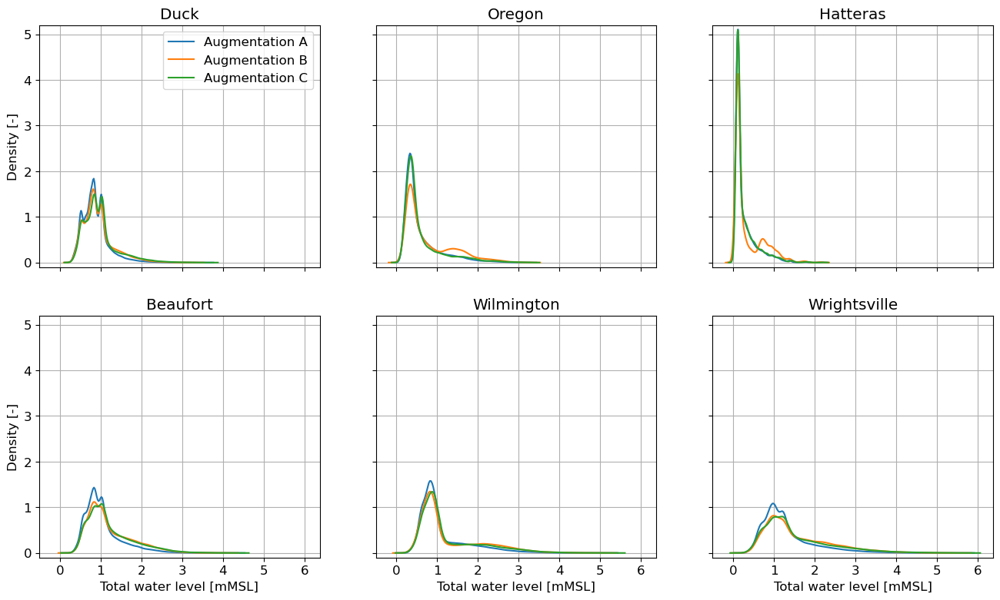

In [14]:
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
alpha = 1
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3, sharex = True, sharey = True)
for i in range(6):
    print(stations[i])
    axi = axs.flatten()[i]
    print(f'    max yAug0: {np.max(yAug0[:, i, 0]):0.2f}')
    sns.kdeplot(yAug0[:, i, 0], ax = axi, alpha = alpha)
    print(f'    max yAug1: {np.max(yAug1[:, i, 0]):0.2f}')
    sns.kdeplot(yAug1[:, i, 0], ax = axi, color = ccolors[1], alpha = alpha)
    print(f'    max yAug2: {np.max(yAug2[:, i, 0]):0.2f}')
    sns.kdeplot(yAug2[:, i, 0], ax = axi, color = ccolors[2], alpha = alpha)
    axi.set_title(stations[i])
    axi.grid(True)
    axi.set_ylim([-0.1, 5.2])

axs[0, 0].legend(['Augmentation A', 'Augmentation B', 'Augmentation C'], frameon = True)
axs[0, 0].set_ylabel('Density [-]')
axs[1, 0].set_ylabel('Density [-]')
axs[1, 0].set_xlabel('Total water level [mMSL]')
axs[1, 1].set_xlabel('Total water level [mMSL]')
axs[1, 2].set_xlabel('Total water level [mMSL]')
fig.savefig(r'../documents/thesis/histograms_augmentation.png', dpi = 300, bbox_inches = 'tight')

## Validation curves

In [72]:
# def mspe(y_true, y_pred):
#     return np.mean(((y_true - y_pred) / y_true) * 100)
def mean_dif(y_true, y_pred):
    return np.mean((y_true - y_pred))

#### Architectures

In [3]:
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/93aa')
hist93aa = pd.read_csv(pathin/'history_93aa_Beaufort_fold1.csv', index_col = 0)
val93aa = pd.read_csv(pathin/'predValSet_93aa_Beaufort_fold1.csv', index_col = 0)

pathin = Path(r'../models/NNmodel/95/Beaufort')
hist95 = pd.read_csv(pathin/'history_95_Beaufort_fold1.csv', index_col = 0)

pathin = Path(r'../models/NNmodel/84/Beaufort')
hist84 = pd.read_csv(pathin/'history_84_Beaufort_fold1.csv', index_col = 0)

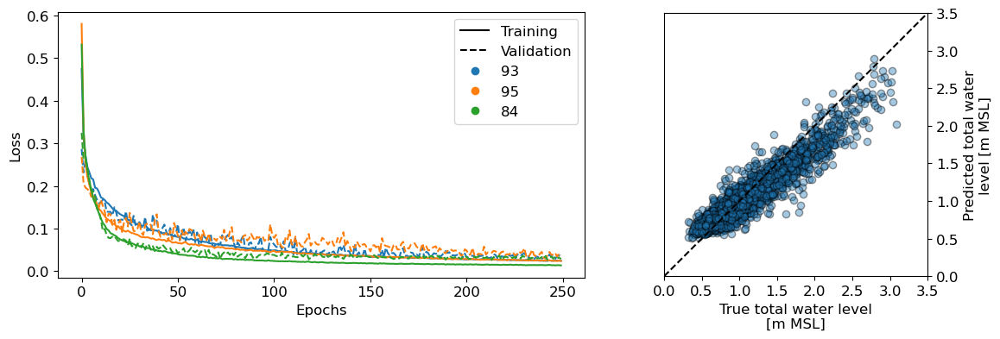

In [4]:
fig, ax = plt.subplots(figsize = (13, 4), gridspec_kw={'width_ratios': [2, 1]}, ncols=2)
hist93aa['loss'].plot(ax = ax[0], color = ccolors[0], label = '_nolegend_')
hist93aa['val_loss'].plot(ax = ax[0], color = ccolors[0], ls = '--', label = '_nolegend_')
hist95['loss'].plot(ax = ax[0], color = ccolors[1], label = '_nolegend_')
hist95['val_loss'].plot(ax = ax[0], color = ccolors[1], ls = '--', label = '_nolegend_')
hist84['loss'].plot(ax = ax[0], color = ccolors[2], label = '_nolegend_')
hist84['val_loss'].plot(ax = ax[0], color = ccolors[2], ls = '--', label = '_nolegend_')

ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')

legend_elements = [Line2D([0], [0], color='k', label = 'Training', ls = '-'),
                   Line2D([0], [0], color='k', label = 'Validation', ls = '--'),
                    Line2D([0], [0], color=ccolors[0], label = '93', ls = '', marker = 'o'),
                    Line2D([0], [0], color=ccolors[1], label = '95', ls = '', marker = 'o'),
                    Line2D([0], [0], color=ccolors[2], label = '84', ls = '', marker = 'o')]
ax[0].legend(handles=legend_elements, loc = 'upper right', frameon = True)

ax[1].scatter(x = val93aa['y_val_true'], y = val93aa['y_val_pred'], color = ccolors[0], alpha = 0.4, edgecolor = 'k')
ax[1].plot(np.arange(0, 4, 0.5), np.arange(0, 4, 0.5), ls = '--', color = 'k')
ax[1].set_aspect('equal')
ax[1].set_ylim([0, 3.5])
ax[1].set_xlim([0, 3.5])
ax[1].set_xticks(np.arange(0, 4, 0.5));
ax[1].set_xlabel('True total water level\n[m MSL]')
ax[1].set_ylabel('Predicted total water\nlevel [m MSL]')
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")

#### Hyper Parameter

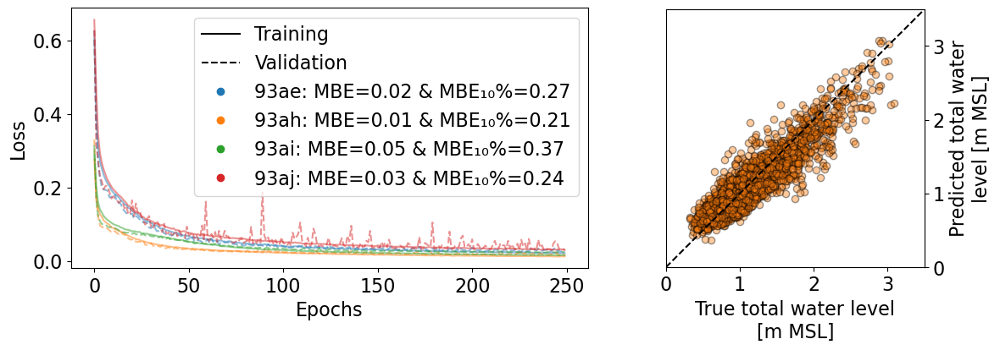

In [15]:
dct_hist = {}
dct_val = {}

pathin = Path(r'../models/NNmodel/1DCNN_final_architecture')

models = [
            '93ae', 
            '93ah', 
            '93ai', 
            '93aj'
        ]
for model in models:
    hist = pd.read_csv(pathin/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
    val = pd.read_csv(pathin/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
    dct_hist[model] = hist
    dct_val[model] = val

fig, ax = plt.subplots(figsize = (13, 4), gridspec_kw={'width_ratios': [2, 1]}, ncols=2)
rmse0 = []
rmse1 = []

for ik, k in enumerate(dct_hist.keys()):

    dct_hist[k]['loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', alpha = 0.5)
    dct_hist[k]['val_loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', ls = '--', alpha = 0.5)

    # ax[1].scatter(x = dct_val[k]['y_val_true'], y = dct_val[k]['y_val_pred'], color = ccolors[ik], alpha = 0.4, edgecolor = 'k')

    rmse0.append(mean_dif(dct_val[k]['y_val_true'].values, dct_val[k]['y_val_pred'].values))
    dummy = dct_val[k].sort_values(by = 'y_val_true', ascending = False).iloc[:int(len(dct_val[k])/10), :]
    rmse1.append(mean_dif(dummy['y_val_true'].values, dummy['y_val_pred'].values))

ax[1].scatter(x = dct_val['93ah']['y_val_true'], y = dct_val['93ah']['y_val_pred'], color = ccolors[1], alpha = 0.4, edgecolor = 'k')
ax[1].plot(np.arange(0, 4, 0.5), np.arange(0, 4, 0.5), ls = '--', color = 'k')

ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')

legend_elements0 = [Line2D([0], [0], color='k', label = 'Training', ls = '-'),
                   Line2D([0], [0], color='k', label = 'Validation', ls = '--')]

rmse_subscript = 'MBE\u2081\u2080\u0025'
labels = [f'{k}: MBE={rmse0[ik]:0.2f} & {rmse_subscript}={rmse1[ik]:0.2f}' for ik, k in enumerate(dct_hist.keys())]

legend_elements1 = [Line2D([0], [0], color=ccolors[ik], label = f'{labels[ik]}', ls = '', marker = 'o') for ik, k in enumerate(dct_hist.keys())]

legend_elements = legend_elements0 + legend_elements1

ax[0].legend(handles=legend_elements, loc = 'upper right', frameon = True)
ax[1].set_aspect('equal')
ax[1].set_xticks(np.arange(0, 4.5, 1.));
ax[1].set_yticks(np.arange(0, 4.5, 1.));
ax[1].set_ylim([0, 3.5])
ax[1].set_xlim([0, 3.5])
ax[1].set_xlabel('True total water level\n[m MSL]')
ax[1].set_ylabel('Predicted total water\nlevel [m MSL]')
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
fig.savefig(r'../documents/defense/netValidation_hyperparameters.png', dpi = 300, bbox_inches = 'tight')

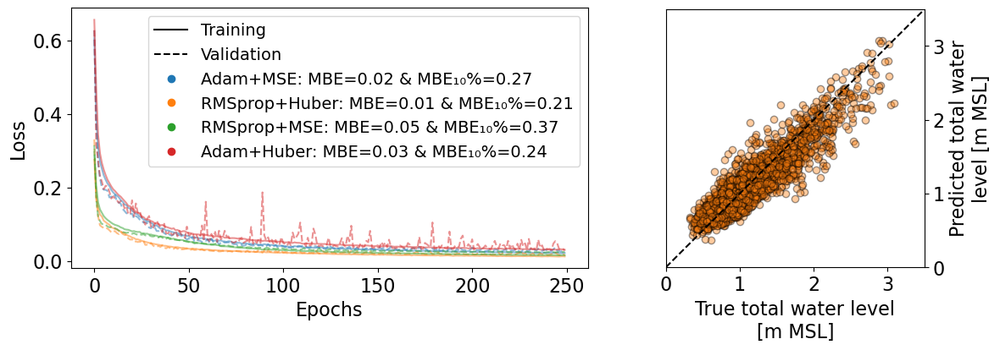

In [18]:
dct_hist = {}
dct_val = {}

pathin = Path(r'../models/NNmodel/1DCNN_final_architecture')

models = [
            '93ae', 
            '93ah', 
            '93ai', 
            '93aj'
        ]
for model in models:
    hist = pd.read_csv(pathin/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
    val = pd.read_csv(pathin/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
    dct_hist[model] = hist
    dct_val[model] = val

fig, ax = plt.subplots(figsize = (13, 4), gridspec_kw={'width_ratios': [2, 1]}, ncols=2)
rmse0 = []
rmse1 = []

modelNames = ['Adam+MSE', 'RMSprop+Huber', 'RMSprop+MSE', 'Adam+Huber']

for ik, k in enumerate(dct_hist.keys()):

    dct_hist[k]['loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', alpha = 0.5)
    dct_hist[k]['val_loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', ls = '--', alpha = 0.5)

    # ax[1].scatter(x = dct_val[k]['y_val_true'], y = dct_val[k]['y_val_pred'], color = ccolors[ik], alpha = 0.4, edgecolor = 'k')

    rmse0.append(mean_dif(dct_val[k]['y_val_true'].values, dct_val[k]['y_val_pred'].values))
    dummy = dct_val[k].sort_values(by = 'y_val_true', ascending = False).iloc[:int(len(dct_val[k])/10), :]
    rmse1.append(mean_dif(dummy['y_val_true'].values, dummy['y_val_pred'].values))

ax[1].scatter(x = dct_val['93ah']['y_val_true'], y = dct_val['93ah']['y_val_pred'], color = ccolors[1], alpha = 0.4, edgecolor = 'k')
ax[1].plot(np.arange(0, 4, 0.5), np.arange(0, 4, 0.5), ls = '--', color = 'k')

ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')

legend_elements0 = [Line2D([0], [0], color='k', label = 'Training', ls = '-'),
                   Line2D([0], [0], color='k', label = 'Validation', ls = '--')]

rmse_subscript = 'MBE\u2081\u2080\u0025'
labels = [f'{modelNames[ik]}: MBE={rmse0[ik]:0.2f} & {rmse_subscript}={rmse1[ik]:0.2f}' for ik, k in enumerate(dct_hist.keys())]

legend_elements1 = [Line2D([0], [0], color=ccolors[ik], label = f'{labels[ik]}', ls = '', marker = 'o') for ik, k in enumerate(dct_hist.keys())]

legend_elements = legend_elements0 + legend_elements1

ax[0].legend(handles=legend_elements, loc = 'upper right', frameon = True, fontsize = 14)
ax[1].set_aspect('equal')
ax[1].set_xticks(np.arange(0, 4.5, 1.));
ax[1].set_yticks(np.arange(0, 4.5, 1.));
ax[1].set_ylim([0, 3.5])
ax[1].set_xlim([0, 3.5])
ax[1].set_xlabel('True total water level\n[m MSL]')
ax[1].set_ylabel('Predicted total water\nlevel [m MSL]')
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
fig.savefig(r'../documents/defense/netValidation_hyperparameters2.png', dpi = 300, bbox_inches = 'tight')

#### Augmentation size

In [ ]:
# dct_hist = {}
# dct_val = {}

# pathin = Path(r'../models/NNmodel/1DCNN_final_architecture')

# models = [
#             '93ak', 
#             '93ah',
#             '93as',
#             '93at'
#         ]

# for model in models:
#     hist = pd.read_csv(pathin/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
#     val = pd.read_csv(pathin/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
#     dct_hist[model] = hist
#     dct_val[model] = val

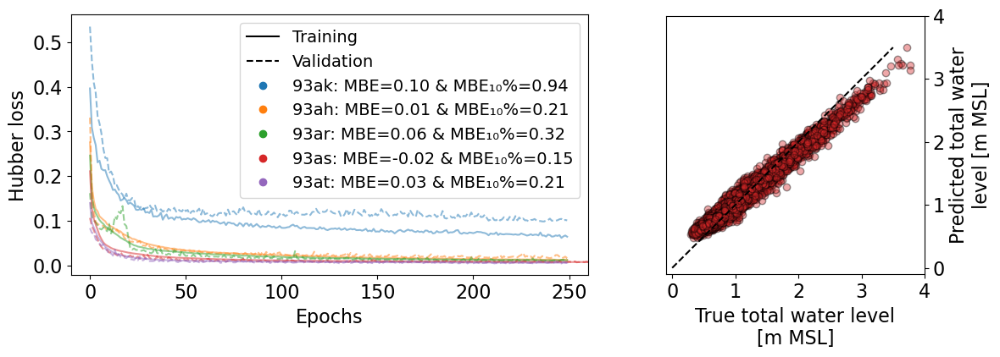

In [21]:
dct_hist = {}
dct_val = {}

pathin = Path(r'../models/NNmodel/1DCNN_final_architecture')

models = [
            '93ak', 
            '93ah',
            '93ar',
            '93as',
            '93at'
        ]

for model in models:

    if model == '93as':
        hist = pd.read_csv(pathin/'fftAndLocalTides'/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
        val = pd.read_csv(pathin/'fftAndLocalTides'/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
    else:
        hist = pd.read_csv(pathin/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
        val = pd.read_csv(pathin/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
    dct_hist[model] = hist
    dct_val[model] = val

fig, ax = plt.subplots(figsize = (13, 4), gridspec_kw={'width_ratios': [2, 1]}, ncols=2)
rmse0 = []
rmse1 = []

for ik, k in enumerate(dct_hist.keys()):

    dct_hist[k]['loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', alpha = 0.5)
    dct_hist[k]['val_loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', ls = '--', alpha = 0.5)

    # ax[1].scatter(x = dct_val[k]['y_val_true'], y = dct_val[k]['y_val_pred'], color = ccolors[ik], alpha = 0.4, edgecolor = 'k')

    rmse0.append(mean_dif(dct_val[k]['y_val_true'].values, dct_val[k]['y_val_pred'].values))
    dummy = dct_val[k].sort_values(by = 'y_val_true', ascending = False).iloc[:int(len(dct_val[k])/10), :]
    rmse1.append(mean_dif(dummy['y_val_true'].values, dummy['y_val_pred'].values))

ax[1].scatter(x = dct_val['93as']['y_val_true'], y = dct_val['93as']['y_val_pred'], color = ccolors[3], alpha = 0.4, edgecolor = 'k')
ax[1].plot(np.arange(0, 4, 0.5), np.arange(0, 4, 0.5), ls = '--', color = 'k')

ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Hubber loss')

legend_elements0 = [Line2D([0], [0], color='k', label = 'Training', ls = '-'),
                   Line2D([0], [0], color='k', label = 'Validation', ls = '--')]

rmse_subscript = 'MBE\u2081\u2080\u0025'
labels = [f'{k}: MBE={rmse0[ik]:0.2f} & {rmse_subscript}={rmse1[ik]:0.2f}' for ik, k in enumerate(dct_hist.keys())]

legend_elements1 = [Line2D([0], [0], color=ccolors[ik], label = f'{labels[ik]}', ls = '', marker = 'o') for ik, k in enumerate(dct_hist.keys())]

legend_elements = legend_elements0 + legend_elements1

ax[0].legend(handles=legend_elements, loc = 'upper right', frameon = True, fontsize = 14)
ax[1].set_aspect('equal')
ax[1].set_xticks(np.arange(0, 5, 1));
ax[1].set_ylim([-0.1, 4])
ax[1].set_xlim([-0.1, 4])
ax[1].set_xlabel('True total water level\n[m MSL]')
ax[1].set_ylabel('Predicted total water\nlevel [m MSL]')
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
ax[0].set_xlim([-10, 260])
fig.savefig(r'../documents/defense/netValidation_augmentation.png', dpi = 300, bbox_inches = 'tight')

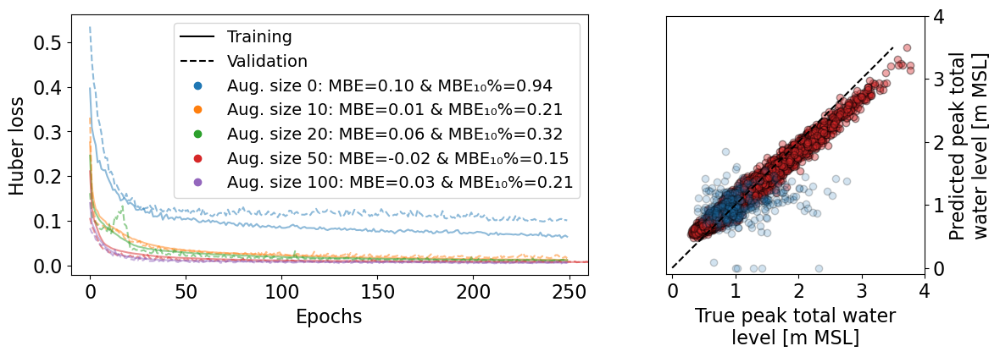

In [92]:
dct_hist = {}
dct_val = {}

pathin = Path(r'../models/NNmodel/1DCNN_final_architecture')

models = [
            '93ak', 
            '93ah',
            '93ar',
            '93as',
            '93at'
        ]

for model in models:

    if model == '93as':
        hist = pd.read_csv(pathin/'fftAndLocalTides'/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
        val = pd.read_csv(pathin/'fftAndLocalTides'/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
    else:
        hist = pd.read_csv(pathin/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
        val = pd.read_csv(pathin/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
    dct_hist[model] = hist
    dct_val[model] = val

fig, ax = plt.subplots(figsize = (13, 4), gridspec_kw={'width_ratios': [2, 1]}, ncols=2)
rmse0 = []
rmse1 = []

for ik, k in enumerate(dct_hist.keys()):

    dct_hist[k]['loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', alpha = 0.5)
    dct_hist[k]['val_loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', ls = '--', alpha = 0.5)

    # ax[1].scatter(x = dct_val[k]['y_val_true'], y = dct_val[k]['y_val_pred'], color = ccolors[ik], alpha = 0.4, edgecolor = 'k')

    rmse0.append(mean_dif(dct_val[k]['y_val_true'].values, dct_val[k]['y_val_pred'].values))
    dummy = dct_val[k].sort_values(by = 'y_val_true', ascending = False).iloc[:int(len(dct_val[k])/10), :]
    rmse1.append(mean_dif(dummy['y_val_true'].values, dummy['y_val_pred'].values))

ax[1].scatter(x = dct_val['93as']['y_val_true'], y = dct_val['93as']['y_val_pred'], color = ccolors[3], alpha = 0.4, edgecolor = 'k')
ax[1].scatter(x = dct_val['93ak']['y_val_true'], y = dct_val['93ak']['y_val_pred'], color = ccolors[0], alpha = 0.2, edgecolor = 'k')
ax[1].plot(np.arange(0, 4, 0.5), np.arange(0, 4, 0.5), ls = '--', color = 'k')

ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Huber loss')

legend_elements0 = [Line2D([0], [0], color='k', label = 'Training', ls = '-'),
                   Line2D([0], [0], color='k', label = 'Validation', ls = '--')]

rmse_subscript = 'MBE\u2081\u2080\u0025'
modelNames = ['Aug. size 0', 'Aug. size 10', 'Aug. size 20', 'Aug. size 50', 'Aug. size 100']
labels = [f'{modelNames[ik]}: MBE={rmse0[ik]:0.2f} & {rmse_subscript}={rmse1[ik]:0.2f}' for ik, k in enumerate(dct_hist.keys())]

legend_elements1 = [Line2D([0], [0], color=ccolors[ik], label = f'{labels[ik]}', ls = '', marker = 'o') for ik, k in enumerate(dct_hist.keys())]

legend_elements = legend_elements0 + legend_elements1

ax[0].legend(handles=legend_elements, loc = 'upper right', frameon = True, fontsize = 14)
ax[1].set_aspect('equal')
ax[1].set_xticks(np.arange(0, 5, 1));
ax[1].set_ylim([-0.1, 4])
ax[1].set_xlim([-0.1, 4])
ax[1].set_xlabel('True peak total water\nlevel [m MSL]')
ax[1].set_ylabel('Predicted peak total\nwater level [m MSL]')
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
ax[0].set_xlim([-10, 260])
fig.savefig(r'../documents/defense/netValidation_augmentation2.png', dpi = 300, bbox_inches = 'tight')

#### Tides

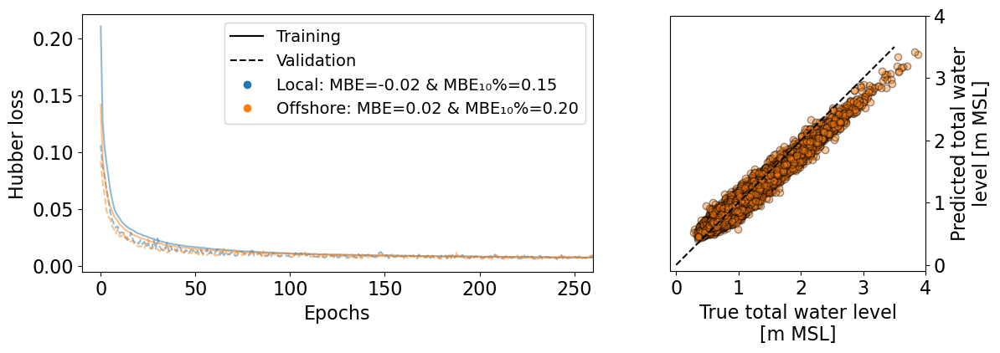

In [24]:
dct_hist = {}
dct_val = {}

pathin = Path(r'../models/NNmodel/1DCNN_final_architecture')

model = '93as'
inputs = [r'fftAndLocalTides', r'fftAndOffshoreTides']

for input in inputs:
    hist = pd.read_csv(pathin/input/model/f'history_{model}_Beaufort_fold1.csv', index_col = 0)
    val = pd.read_csv(pathin/input/model/f'predValSet_{model}_Beaufort_fold1.csv', index_col = 0)
    dct_hist[input] = hist
    dct_val[input] = val

fig, ax = plt.subplots(figsize = (13, 4), gridspec_kw={'width_ratios': [2, 1]}, ncols=2)
rmse0 = []
rmse1 = []

for ik, k in enumerate(dct_hist.keys()):

    dct_hist[k]['loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', alpha = 0.5)
    dct_hist[k]['val_loss'].plot(ax = ax[0], color = ccolors[ik], label = '_nolegend_', ls = '--', alpha = 0.5)

    rmse0.append(mean_dif(dct_val[k]['y_val_true'].values, dct_val[k]['y_val_pred'].values))
    dummy = dct_val[k].sort_values(by = 'y_val_true', ascending = False).iloc[:int(len(dct_val[k])/10), :]
    rmse1.append(mean_dif(dummy['y_val_true'].values, dummy['y_val_pred'].values))

# ax[1].scatter(x = dct_val['fftAndLocalTides']['y_val_true'], y = dct_val['fftAndLocalTides']['y_val_pred'], color = ccolors[0], 
            #   alpha = 0.4, edgecolor = 'k')
ax[1].scatter(x = dct_val['fftAndOffshoreTides']['y_val_true'], y = dct_val['fftAndOffshoreTides']['y_val_pred'], color = ccolors[1], 
              alpha = 0.4, edgecolor = 'k')
ax[1].plot(np.arange(0, 4, 0.5), np.arange(0, 4, 0.5), ls = '--', color = 'k')

ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Hubber loss')

legend_elements0 = [Line2D([0], [0], color='k', label = 'Training', ls = '-'),
                   Line2D([0], [0], color='k', label = 'Validation', ls = '--')]

rmse_subscript = 'MBE\u2081\u2080\u0025'
aux = ['Local', 'Offshore']
labels = [f'{k}: MBE={rmse0[ik]:0.2f} & {rmse_subscript}={rmse1[ik]:0.2f}' for ik, k in enumerate(aux)]

legend_elements1 = [Line2D([0], [0], color=ccolors[ik], label = f'{labels[ik]}', ls = '', marker = 'o') for ik, k in enumerate(aux)]

legend_elements = legend_elements0 + legend_elements1

ax[0].legend(handles=legend_elements, loc = 'upper right', frameon = True, fontsize = 14)
ax[1].set_aspect('equal')
ax[1].set_xticks(np.arange(0, 5, 1));
ax[1].set_ylim([-0.1, 4])
ax[1].set_xlim([-0.1, 4])
ax[1].set_xlabel('True total water level\n[m MSL]')
ax[1].set_ylabel('Predicted total water\nlevel [m MSL]')
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
ax[0].set_xlim([-10, 260])

fig.savefig(r'../documents/defense/netValidation_tides.png', dpi = 300, bbox_inches = 'tight')

#### Multitask model

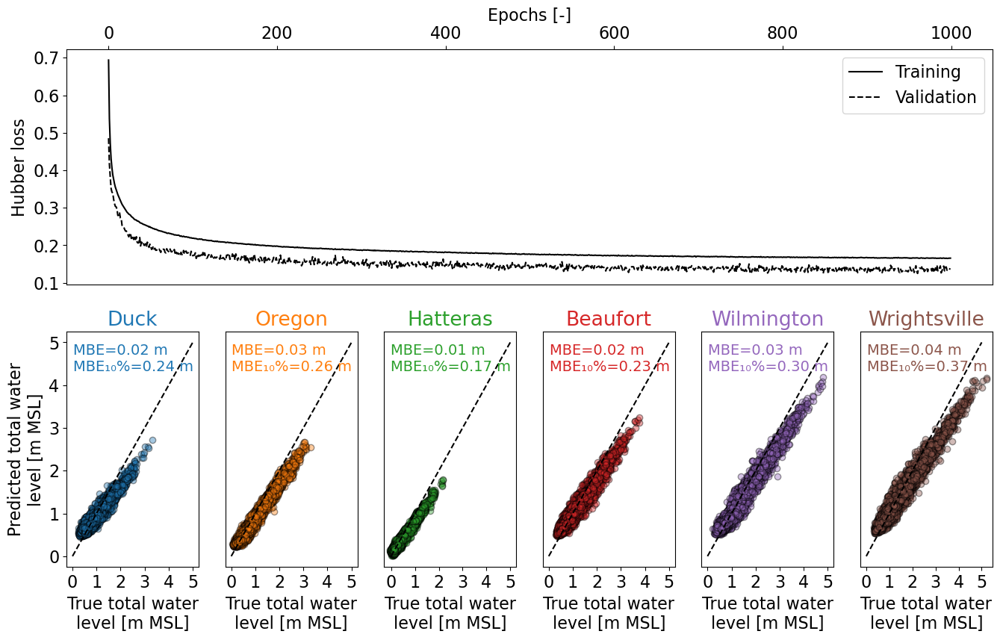

In [26]:
## augmented all 50 times
model = '93js'

hist = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/93js/history_93js_fold1.csv', index_col = 0)
val = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/93js/predValSet_93js.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=14,
            verticalalignment='top', color = ccolors[ic])

# fig.savefig(r'../documents/defense/netValidation_1model_localtides.png', dpi = 300, bbox_inches = 'tight')

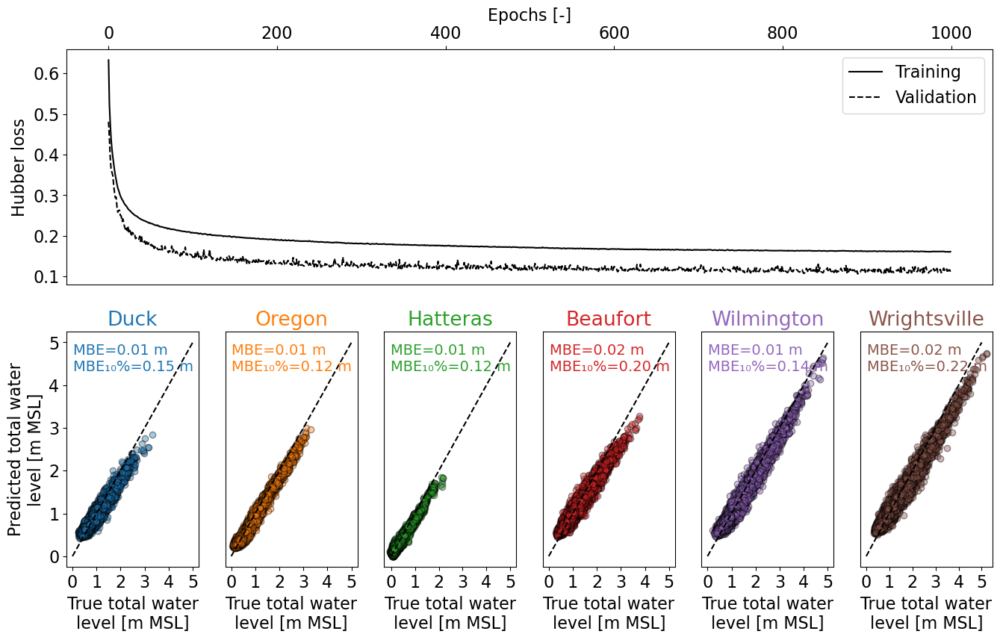

In [27]:
## augmented all 50 times but using offshore tide
model = '93js'

hist = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93js/history_93js_fold1.csv', index_col = 0)
val = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93js/predValSet_93js.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=14,
            verticalalignment='top', color = ccolors[ic])

fig.savefig(r'../documents/defense/netValidation_1model_offshoretides.png', dpi = 300, bbox_inches = 'tight')

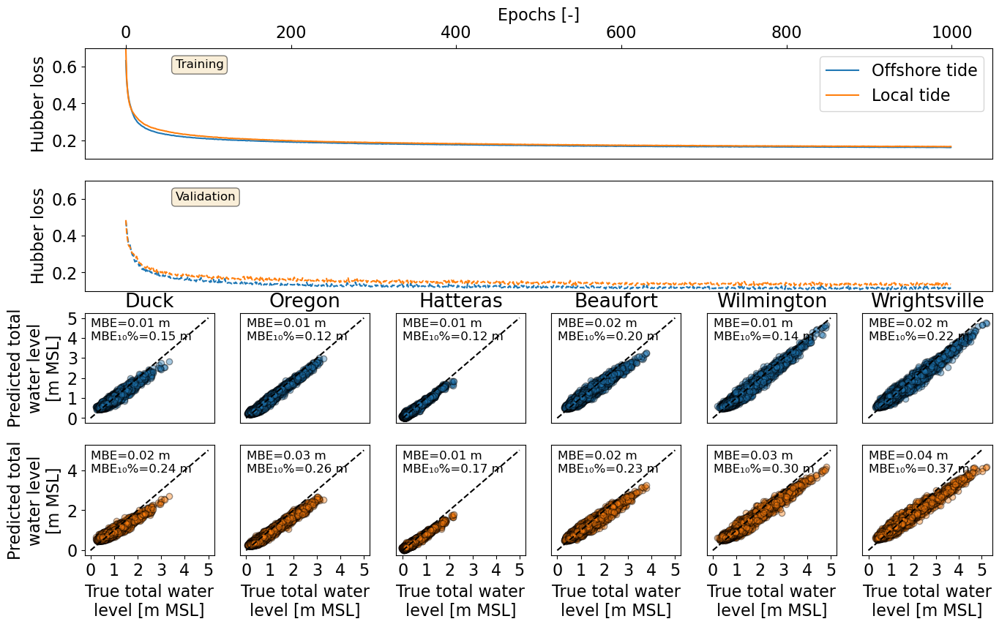

In [29]:
## augmented all 50 times but using offshore tide
model = '93js'
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

hist0 = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93js/history_93js_fold1.csv', index_col = 0)
val0 = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93js/predValSet_93js.csv', index_col = 0)

hist1 = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/93js/history_93js_fold1.csv', index_col = 0)
val1 = pd.read_csv(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/93js/predValSet_93js.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(4, 6)

ax0 = fig.add_subplot(grid[0, :])
hist0['rmse'].plot(ax = ax0, color = ccolors[0], label = 'Offshore tide')
hist1['rmse'].plot(ax = ax0, color = ccolors[1], label = 'Local tide')
ax0.set_ylim([0.1, 0.7])
ax0.text(0.1, 0.9, 'Training', transform=ax0.transAxes, fontsize=12,
            verticalalignment='top', color = 'k', bbox=props)

ax1 = fig.add_subplot(grid[1, :])
hist0['val_rmse'].plot(ax = ax1, color = ccolors[0], ls = '--')
hist1['val_rmse'].plot(ax = ax1, color = ccolors[1], ls = '--')
ax1.set_ylim([0.1, 0.7])
ax1.text(0.1, 0.9, 'Validation', transform=ax1.transAxes, fontsize=12,
            verticalalignment='top', color = 'k', bbox=props)

ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')
ax1.set_xticks([])          # Remove ticks
ax1.set_xticklabels([])   
ax1.set_ylabel('Hubber loss')
# ax0.xaxis.tick_top()
# ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val0.columns[:6]):
    axi = fig.add_subplot(grid[2, ic])
    axi.scatter(x = val0[c], y = val0[f'{c}_pred'], color = ccolors[0], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_yticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = 'k')
    axi.axes.get_xaxis().set_visible(False)

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total\nwater level\n[m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val0[f'{c}'], val0[f'{c}_pred'])
    dummy = val0.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val0)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = 'k')
    
    axi = fig.add_subplot(grid[3, ic])
    axi.scatter(x = val1[c], y = val1[f'{c}_pred'], color = ccolors[1], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    # axi.set_title(f'{c}', color = 'k')

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total\nwater level\n[m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val1[f'{c}'], val1[f'{c}_pred'])
    dummy = val1.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val1)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = 'k')

fig.savefig(r'../documents/defense/netValidation_1model_offshore_vs_local_tides.png', dpi = 300, bbox_inches = 'tight')

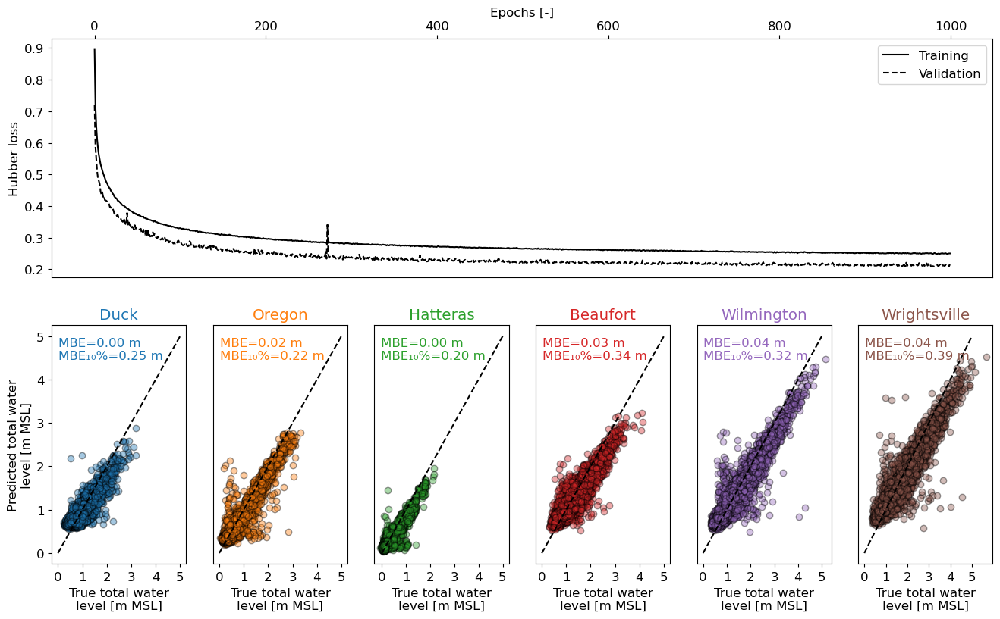

In [6]:
## augmented 50 times storms with total water level above 1.5m
model = '93jx'

hist = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/history_{model}_fold1.csv', index_col = 0)
val = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/predValSet_{model}.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ic])

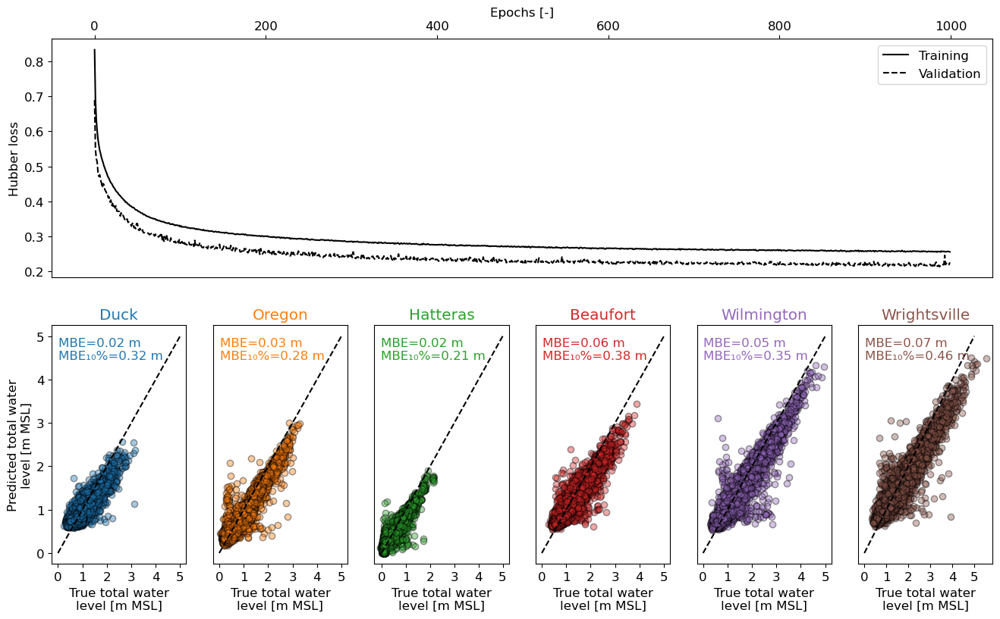

In [7]:
## augmented 10% of largest surge events
model = '93jy'

hist = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/history_{model}_fold1.csv', index_col = 0)
val = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/predValSet_{model}.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])1
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ic])

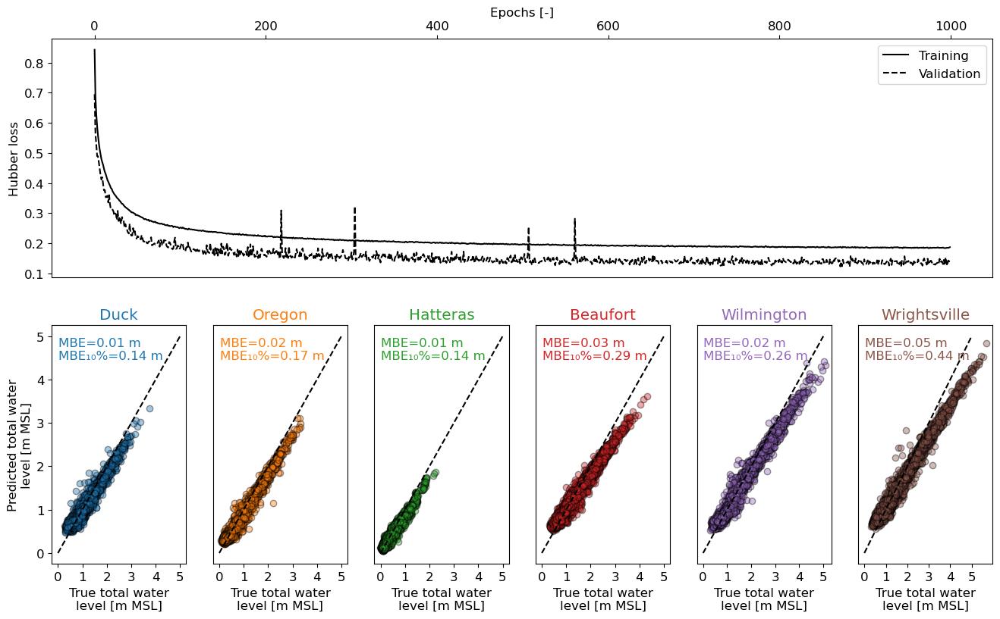

In [8]:
## augmented all aligning peak surge with high tide
model = '93jz'

hist = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/history_{model}_fold1.csv', index_col = 0)
val = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/predValSet_{model}.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ic])

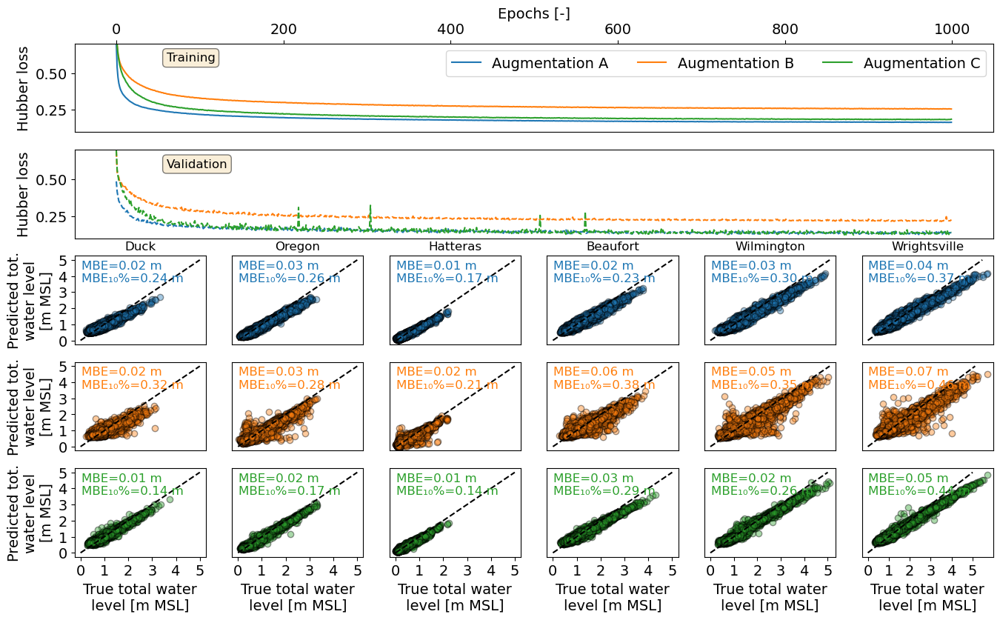

In [50]:
with plt.rc_context({'font.size': 14}):
    ## augmented all aligning peak surge with high tide
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    model = '93js'
    hist0 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/history_{model}_fold1.csv', index_col = 0)
    val0 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/predValSet_{model}.csv', index_col = 0)

    model = '93jy'
    hist1 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/history_{model}_fold1.csv', index_col = 0)
    val1 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/predValSet_{model}.csv', index_col = 0)

    model = '93jz'
    hist2 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/history_{model}_fold1.csv', index_col = 0)
    val2 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/{model}/predValSet_{model}.csv', index_col = 0)

    fig = plt.figure(figsize=(16, 9))
    grid = fig.add_gridspec(5, 6)

    ax0 = fig.add_subplot(grid[0, :])
    hist0['rmse'].plot(ax = ax0, color = ccolors[0], label = 'Augmentation A')
    hist1['rmse'].plot(ax = ax0, color = ccolors[1], label = 'Augmentation B')
    hist2['rmse'].plot(ax = ax0, color = ccolors[2], label = 'Augmentation C')
    ax0.set_ylim([0.1, 0.7])
    ax0.text(0.1, 0.9, 'Training', transform=ax0.transAxes, fontsize=12,
                verticalalignment='top', color = 'k', bbox=props)

    ax1 = fig.add_subplot(grid[1, :])
    hist0['val_rmse'].plot(ax = ax1, color = ccolors[0], ls = '--')
    hist1['val_rmse'].plot(ax = ax1, color = ccolors[1], ls = '--')
    hist2['val_rmse'].plot(ax = ax1, color = ccolors[2], ls = '--')
    ax1.set_ylim([0.1, 0.7])
    ax1.text(0.1, 0.9, 'Validation', transform=ax1.transAxes, fontsize=12,
                verticalalignment='top', color = 'k', bbox=props)

    ax0.legend(frameon = True, ncol = 3)
    ax0.set_xlabel('Epochs [-]')
    ax0.set_ylabel('Hubber loss')
    ax0.xaxis.tick_top()
    ax0.xaxis.set_label_position('top')
    ax1.set_xticks([])          # Remove ticks
    ax1.set_xticklabels([])   
    ax1.set_ylabel('Hubber loss')

    for ic, c in enumerate(val0.columns[:6]):
        axi = fig.add_subplot(grid[2, ic])
        axi.scatter(x = val0[c], y = val0[f'{c}_pred'], color = ccolors[0], 
                    alpha = 0.4, edgecolor = 'k')
        axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
        axi.set_xticks(np.arange(0, 6, 1))
        axi.set_yticks(np.arange(0, 6, 1))
        axi.set_xlabel('True total water\nlevel [m MSL]')
        axi.set_title(f'{c}', color = 'k', fontsize = 12)
        axi.axes.get_xaxis().set_visible(False)

        if ic > 0:
            axi.axes.get_yaxis().set_visible(False)
        else:
            axi.set_ylabel('Predicted tot.\nwater level\n[m MSL]')
            axi.set_yticks(np.arange(0, 6, 1))

        rmse_subscript = 'MBE\u2081\u2080\u0025'
        mbe0 = mean_dif(val0[f'{c}'], val0[f'{c}_pred'])
        dummy = val0.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val0)/10), :]
        mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
        axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
                verticalalignment='top', color = ccolors[0])
        
        axi = fig.add_subplot(grid[3, ic])
        axi.scatter(x = val1[c], y = val1[f'{c}_pred'], color = ccolors[1], 
                    alpha = 0.4, edgecolor = 'k')
        axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
        axi.set_xticks(np.arange(0, 6, 1))
        axi.set_xlabel('True total water\nlevel [m MSL]')
        axi.axes.get_xaxis().set_visible(False)

        if ic > 0:
            axi.axes.get_yaxis().set_visible(False)
        else:
            axi.set_ylabel('Predicted tot.\nwater level\n[m MSL]')
            axi.set_yticks(np.arange(0, 6, 1))

        rmse_subscript = 'MBE\u2081\u2080\u0025'
        mbe0 = mean_dif(val1[f'{c}'], val1[f'{c}_pred'])
        dummy = val1.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val1)/10), :]
        mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
        axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
                verticalalignment='top', color = ccolors[1])
        
        axi = fig.add_subplot(grid[4, ic])
        axi.scatter(x = val2[c], y = val2[f'{c}_pred'], color = ccolors[2], 
                    alpha = 0.4, edgecolor = 'k')
        axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
        axi.set_xticks(np.arange(0, 6, 1))
        
        axi.set_xlabel('True total water\nlevel [m MSL]')

        if ic > 0:
            axi.axes.get_yaxis().set_visible(False)
        else:
            axi.set_ylabel('Predicted tot.\nwater level\n[m MSL]')
            axi.set_yticks(np.arange(0, 6, 1))

        rmse_subscript = 'MBE\u2081\u2080\u0025'
        mbe0 = mean_dif(val2[f'{c}'], val2[f'{c}_pred'])
        dummy = val2.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val2)/10), :]
        mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
        axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
                verticalalignment='top', color = ccolors[2])
        
    fig.savefig(r'../documents/defense/netValidation_1model_augmentation_procedures.png', dpi = 300, bbox_inches = 'tight')

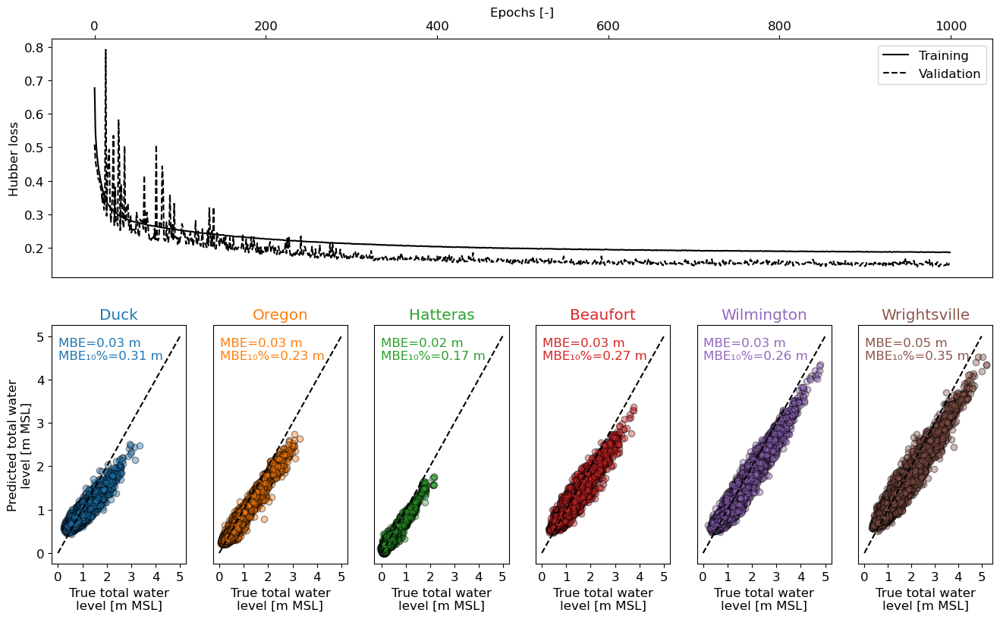

In [8]:
## nofftOffshoreTidesCoords
model = '93js'

hist = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/nofftOffshoreTidesCoords/{model}/history_{model}_fold1.csv', index_col = 0)
val = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/nofftOffshoreTidesCoords/{model}/predValSet_{model}.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ic])

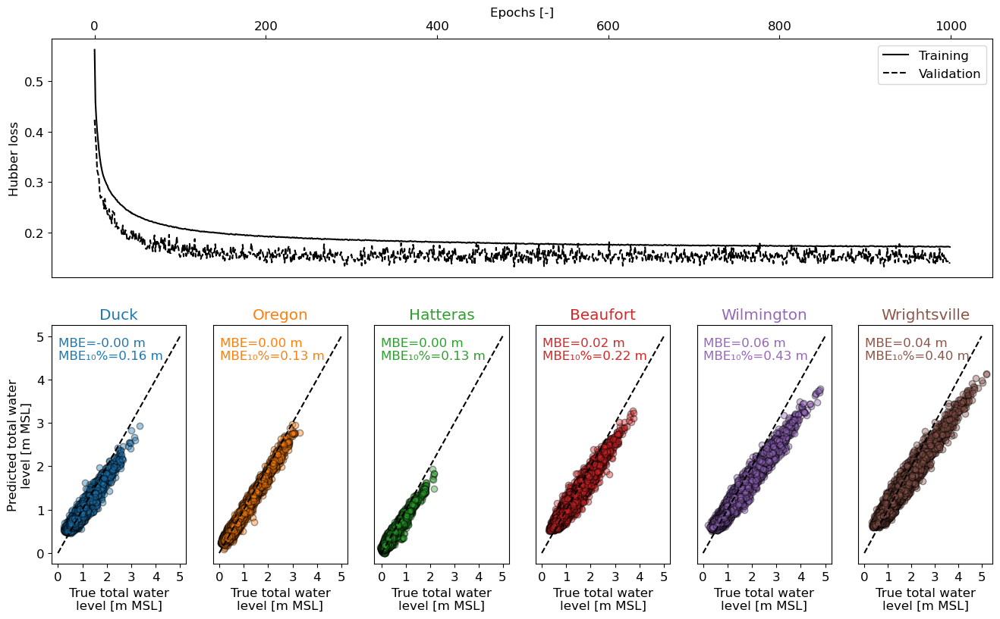

In [9]:
## onlyfftOffshoreTidesCoords
model = '93js'

hist = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/onlyfftOffshoreTidesCoords/{model}/history_{model}_fold1.csv', index_col = 0)
val = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/onlyfftOffshoreTidesCoords/{model}/predValSet_{model}.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ic])

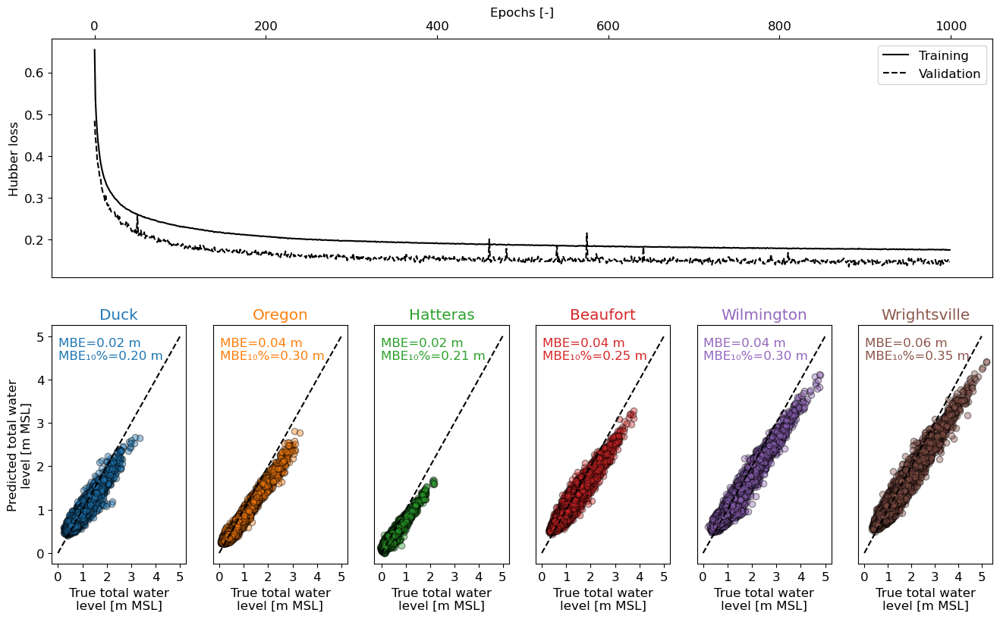

In [12]:
## fftOffshoreTidesCoords
model = '93js'

hist = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftOffshoreTidesCoords/{model}/history_{model}_fold1.csv', index_col = 0)
val = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftOffshoreTidesCoords/{model}/predValSet_{model}.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(2, 6)

ax0 = fig.add_subplot(grid[0, :])
hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')

for ic, c in enumerate(val.columns[:6]):
    axi = fig.add_subplot(grid[1, ic])
    axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = ccolors[ic])

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total water\nlevel [m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
    dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ic])

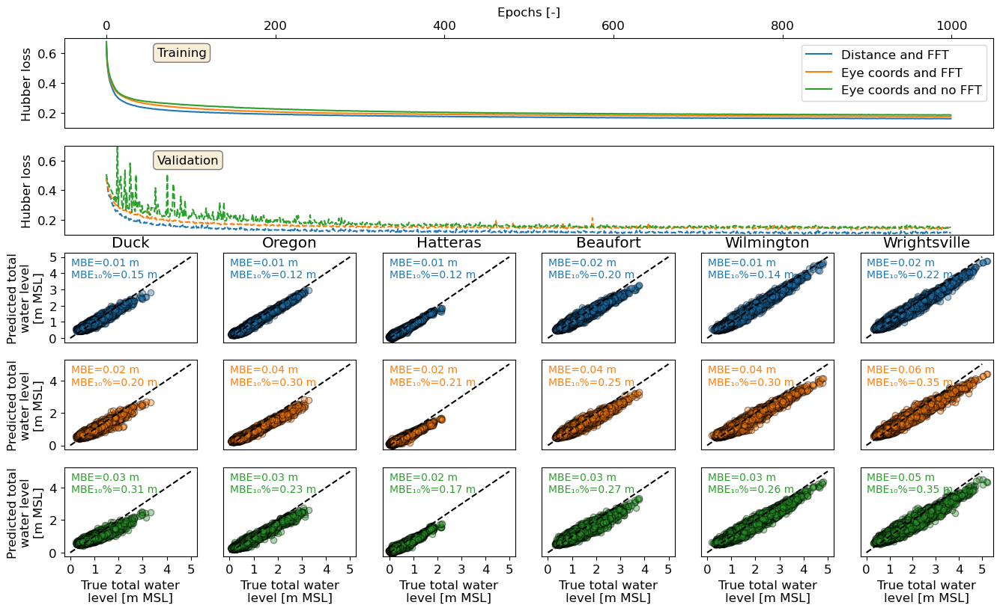

In [35]:
## augmented all aligning peak surge with high tide
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

model = '93js'
hist0 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/{model}/history_{model}_fold1.csv', index_col = 0)
val0 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/{model}/predValSet_{model}.csv', index_col = 0)

hist1 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftOffshoreTidesCoords/{model}/history_{model}_fold1.csv', index_col = 0)
val1 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftOffshoreTidesCoords/{model}/predValSet_{model}.csv', index_col = 0)

hist2 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/nofftOffshoreTidesCoords/{model}/history_{model}_fold1.csv', index_col = 0)
val2 = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/nofftOffshoreTidesCoords/{model}/predValSet_{model}.csv', index_col = 0)

fig = plt.figure(figsize=(16, 9))
grid = fig.add_gridspec(5, 6)

ax0 = fig.add_subplot(grid[0, :])
hist0['rmse'].plot(ax = ax0, color = ccolors[0], label = 'Distance and FFT')
hist1['rmse'].plot(ax = ax0, color = ccolors[1], label = 'Eye coords and FFT')
hist2['rmse'].plot(ax = ax0, color = ccolors[2], label = 'Eye coords and no FFT')
ax0.set_ylim([0.1, 0.7])
ax0.text(0.1, 0.9, 'Training', transform=ax0.transAxes, fontsize=12,
            verticalalignment='top', color = 'k', bbox=props)

ax1 = fig.add_subplot(grid[1, :])
hist0['val_rmse'].plot(ax = ax1, color = ccolors[0], ls = '--')
hist1['val_rmse'].plot(ax = ax1, color = ccolors[1], ls = '--')
hist2['val_rmse'].plot(ax = ax1, color = ccolors[2], ls = '--')
ax1.set_ylim([0.1, 0.7])
ax1.text(0.1, 0.9, 'Validation', transform=ax1.transAxes, fontsize=12,
            verticalalignment='top', color = 'k', bbox=props)

ax0.legend(frameon = True)
ax0.set_xlabel('Epochs [-]')
ax0.set_ylabel('Hubber loss')
ax0.xaxis.tick_top()
ax0.xaxis.set_label_position('top')
ax1.set_xticks([])          # Remove ticks
ax1.set_xticklabels([])   
ax1.set_ylabel('Hubber loss')

for ic, c in enumerate(val0.columns[:6]):
    axi = fig.add_subplot(grid[2, ic])
    axi.scatter(x = val0[c], y = val0[f'{c}_pred'], color = ccolors[0], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_yticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.set_title(f'{c}', color = 'k')
    axi.axes.get_xaxis().set_visible(False)

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total\nwater level\n[m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val0[f'{c}'], val0[f'{c}_pred'])
    dummy = val0.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val0)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=10,
            verticalalignment='top', color = ccolors[0])
    
    axi = fig.add_subplot(grid[3, ic])
    axi.scatter(x = val1[c], y = val1[f'{c}_pred'], color = ccolors[1], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')
    axi.axes.get_xaxis().set_visible(False)

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total\nwater level\n[m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val1[f'{c}'], val1[f'{c}_pred'])
    dummy = val1.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val1)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=10,
            verticalalignment='top', color = ccolors[1])
    
    axi = fig.add_subplot(grid[4, ic])
    axi.scatter(x = val2[c], y = val2[f'{c}_pred'], color = ccolors[2], 
                alpha = 0.4, edgecolor = 'k')
    axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
    axi.set_xticks(np.arange(0, 6, 1))
    axi.set_xlabel('True total water\nlevel [m MSL]')

    if ic > 0:
        axi.axes.get_yaxis().set_visible(False)
    else:
        axi.set_ylabel('Predicted total\nwater level\n[m MSL]')

    rmse_subscript = 'MBE\u2081\u2080\u0025'
    mbe0 = mean_dif(val2[f'{c}'], val2[f'{c}_pred'])
    dummy = val2.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val2)/10), :]
    mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
    axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=10,
            verticalalignment='top', color = ccolors[2])
    
fig.savefig(r'../documents/thesis/netValidation_1model_input_complexity.png', dpi = 300, bbox_inches = 'tight')

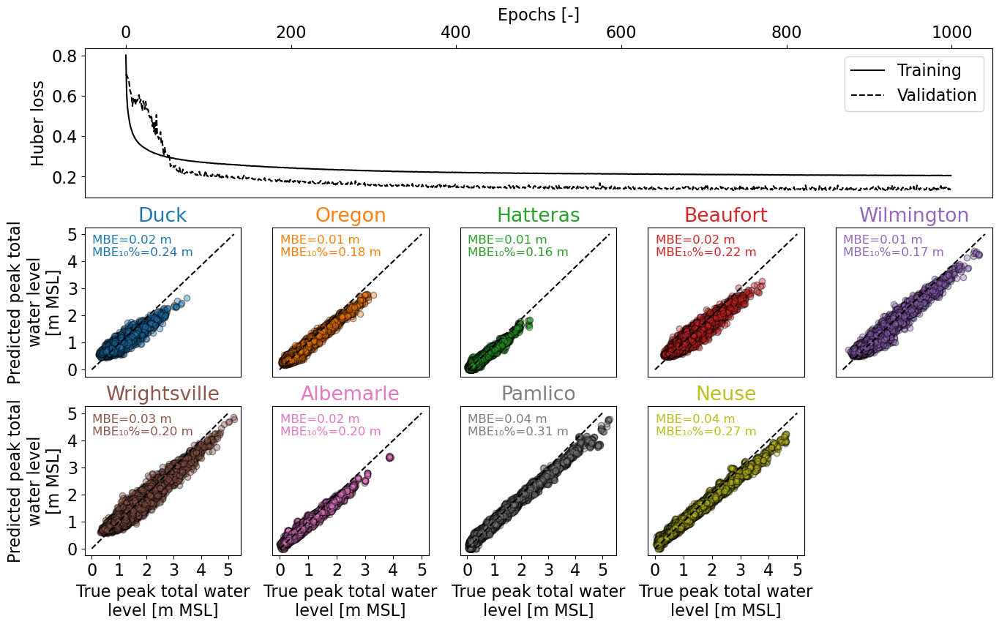

In [76]:
with plt.rc_context({'font.size': 16}):

    ## fftOffshoreTidesCoords
    model = '93ks'

    hist = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/{model}/history_{model}.csv', index_col = 0)
    val = pd.read_csv(f'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/{model}/predValSet_{model}.csv', index_col = 0)

    fig = plt.figure(figsize=(16, 9))
    grid = fig.add_gridspec(3, 5)

    ax0 = fig.add_subplot(grid[0, :])
    hist['rmse'].plot(ax = ax0, color = 'k', label = 'Training')
    hist['val_rmse'].plot(ax = ax0, color = 'k', label = 'Validation', ls = '--')
    ax0.legend(frameon = True)
    ax0.set_xlabel('Epochs [-]')
    ax0.set_ylabel('Huber loss')
    ax0.xaxis.tick_top()
    ax0.xaxis.set_label_position('top')

    for ic, c in enumerate(val.columns[:9]):

        if ic < 5:
            axi = fig.add_subplot(grid[1, ic])
            axi.axes.get_xaxis().set_visible(False)

        else:
            axi = fig.add_subplot(grid[2, ic-5])
            axi.set_xlabel('True peak total water\nlevel [m MSL]')

        axi.scatter(x = val[c], y = val[f'{c}_pred'], color = ccolors[ic], 
                    alpha = 0.4, edgecolor = 'k')
        axi.plot(np.arange(0, 5.5, 0.5), np.arange(0, 5.5, 0.5), ls = '--', color = 'k')
        axi.set_xticks(np.arange(0, 6, 1))
        axi.set_yticks(np.arange(0, 6, 1))
        axi.axes.get_yaxis().set_visible(False)
        if ic == 0 or ic == 5:
            axi.axes.get_yaxis().set_visible(True)
            axi.set_ylabel('Predicted peak total\nwater level\n[m MSL]')
        
        axi.set_title(f'{c}', color = ccolors[ic])

        rmse_subscript = 'MBE\u2081\u2080\u0025'
        mbe0 = mean_dif(val[f'{c}'], val[f'{c}_pred'])
        dummy = val.sort_values(by = f'{c}', ascending = False).iloc[:int(len(val)/10), :]
        mbe1 = mean_dif(dummy[f'{c}'], dummy[f'{c}_pred'])
        axi.text(0.05, 0.95, f'MBE={mbe0:0.2f} m\n{rmse_subscript}={mbe1:0.2f} m', transform=axi.transAxes, fontsize=12,
                verticalalignment='top', color = ccolors[ic])
        
    fig.savefig(r'../documents/defense/netValidation_1model_ALL.png', dpi = 300, bbox_inches = 'tight')

## Test

#### NOAA stations

In [53]:
pInd = Path(r'../models/NNmodel/inputs/random_split')
fInd = r'indices_test_standardScaled_allInputs_augmentedAllX50_def.npy'
dfind = pd.read_csv(pInd/fInd, header=None, names=['ind'])
dfreal = dfind[dfind['ind'] < 1814]
dfaug = dfind[dfind['ind'] >= 1814]

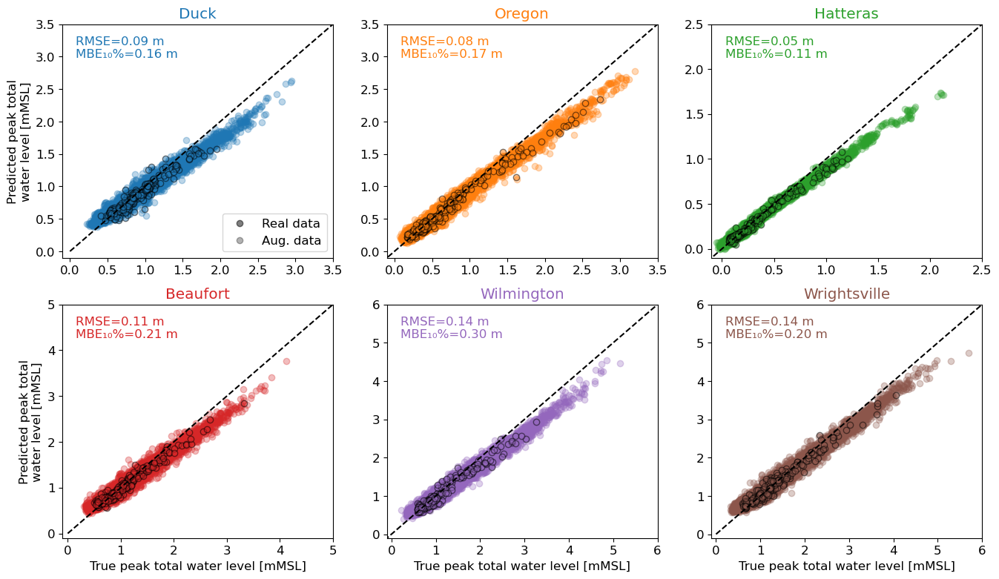

In [8]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
letters = ['d', 'b', 'c', 'a', 'e', 'f']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides')
rmse_subscript = 'MBE\u2081\u2080\u0025'

binsAll = []
for ist, st, l in zip(range(len(stations)), stations, letters):
    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    ax = axs.flatten()[ist]
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    ax.scatter(x = dfa['y_test_true'], y = dfa['y_test_pred'], color = ccolors[ist], alpha = 0.3)
    ax.scatter(x = dfr['y_test_true'], y = dfr['y_test_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
    dummy = ax.get_xticks()
    ax.set_xticks(dummy)
    ax.set_yticks(dummy)
    ax.set_xlim([-0.1, dummy[-1]])
    ax.set_ylim([-0.1, dummy[-1]])
    # print(dummy)
    binsAll.append(dummy)
    ax.plot(dummy, dummy, color = 'k', ls = '--')
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    rmse = np.sqrt(mean_squared_error(df['y_test_true'], df['y_test_pred']))

    dummy = df.sort_values(by = 'y_test_true', ascending = False).iloc[:int(len(df)/10), :]
    mbe = mean_dif(dummy['y_test_true'], dummy['y_test_pred'])
    ax.set_title(f'{st}', color = ccolors[ist])#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
    
    ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ist])

handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
           Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
axs[0, 0].legend(handles=handles, frameon = True, loc = 'lower right')


axs[1, 0].set_xlabel('True peak total water level [mMSL]')
axs[1, 1].set_xlabel('True peak total water level [mMSL]')
axs[1, 2].set_xlabel('True peak total water level [mMSL]')
axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')

fig.savefig(r'../documents/thesis/netTest_scatter_NOAA.png', dpi = 300, bbox_inches = 'tight')

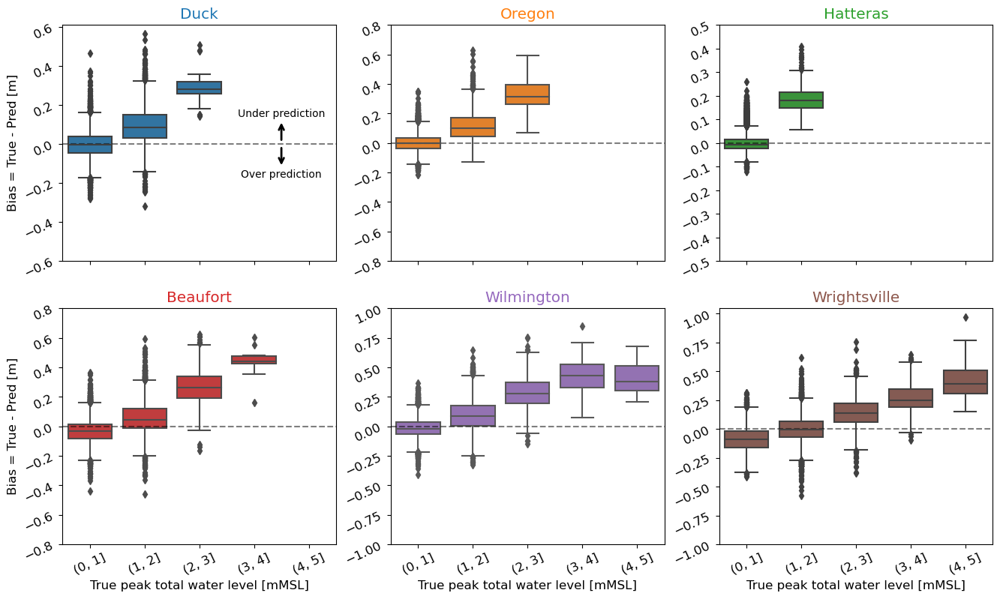

In [9]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3, sharex=True)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
letters = ['d', 'b', 'c', 'a', 'e', 'f']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides')
ymaxs = [0.6, 0.8, 0.5, 0.8, 1, 1]
dys = [0.2, 0.2, 0.1, 0.2, 0.25, 0.25]

for ist, st, l in zip(range(len(stations)), stations, letters):

    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    df['dif'] = df['y_test_true'].values - df['y_test_pred'].values
    ax = axs.flatten()[ist]
    df['y_test_true_bins'] = pd.cut(df['y_test_pred'], bins=np.arange(0, 6, 1))
    ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
    sns.boxplot(x = df['y_test_true_bins'], y = df['dif'], color=ccolors[ist], ax = ax)
    ax.set_title(f'{st}', color = ccolors[ist])
    # atext = AnchoredText(st, loc=3, frameon = True)
    # ax.add_artist(atext)
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    # if ist < 3:
    #     ax.xaxis.tick_top()
    #     ax.xaxis.set_label_position('top')
    ax.tick_params(labelrotation=25)
    # yvals = ax.get_yticks()
    # dy = yvals[-1] - yvals[-2]
    # aux = np.max(np.abs(yvals))
    ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))

# axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
ylabel = 'True peak total water level [mMSL]'
axs[1, 0].set_xlabel(ylabel)
axs[1, 1].set_xlabel(ylabel)
axs[1, 2].set_xlabel(ylabel)
# axs[0, 0].set_xlabel(ylabel)
# axs[0, 1].set_xlabel(ylabel)
# axs[0, 2].set_xlabel(ylabel)

axs[0, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
axs[1, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')


props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
# place a text box in upper left in axes coords
axs[0,0].text(3.5, 0.0, 'Under prediction\n\n\n\n\nOver prediction', fontsize=10,
        verticalalignment='center', bbox=props, horizontalalignment='center')
x_arrow = 3.5  # X-coordinate for the arrow
y_arrow = 0.12    # Y-coordinate for the arrow, between 0 and 1
arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
axs[0, 0].annotate('', xy=(x_arrow, y_arrow), xytext=(3.5, 0.01),
                  arrowprops=arrow_props)
axs[0, 0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(3.5, -0.01),
                  arrowprops=arrow_props)
fig.savefig(r'../documents/thesis/netTest_boxPlot_NOAA.png', dpi = 300, bbox_inches = 'tight')

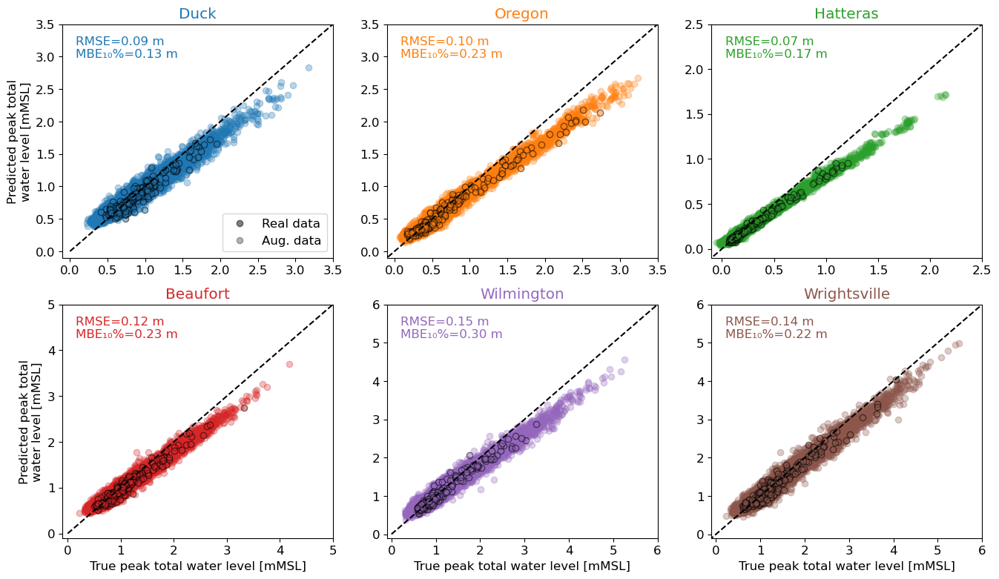

In [6]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
letters = ['d', 'b', 'c', 'a', 'e', 'f']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides')
rmse_subscript = 'MBE\u2081\u2080\u0025'

binsAll = []
for ist, st, l in zip(range(len(stations)), stations, letters):
    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    ax = axs.flatten()[ist]
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    ax.scatter(x = dfa['y_test_true'], y = dfa['y_test_pred'], color = ccolors[ist], alpha = 0.3)
    ax.scatter(x = dfr['y_test_true'], y = dfr['y_test_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
    dummy = ax.get_xticks()
    ax.set_xticks(dummy)
    ax.set_yticks(dummy)
    ax.set_xlim([-0.1, dummy[-1]])
    ax.set_ylim([-0.1, dummy[-1]])
    # print(dummy)
    binsAll.append(dummy)
    ax.plot(dummy, dummy, color = 'k', ls = '--')
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    rmse = np.sqrt(mean_squared_error(df['y_test_true'], df['y_test_pred']))

    dummy = df.sort_values(by = 'y_test_true', ascending = False).iloc[:int(len(df)/10), :]
    mbe = mean_dif(dummy['y_test_true'], dummy['y_test_pred'])
    ax.set_title(f'{st}', color = ccolors[ist])#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
    
    ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ist])

handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
           Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
axs[0, 0].legend(handles=handles, frameon = True, loc = 'lower right')


axs[1, 0].set_xlabel('True peak total water level [mMSL]')
axs[1, 1].set_xlabel('True peak total water level [mMSL]')
axs[1, 2].set_xlabel('True peak total water level [mMSL]')
axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')

fig.savefig(r'../documents/thesis/netTest_scatter_NOAA_offshoretide.png', dpi = 300, bbox_inches = 'tight')

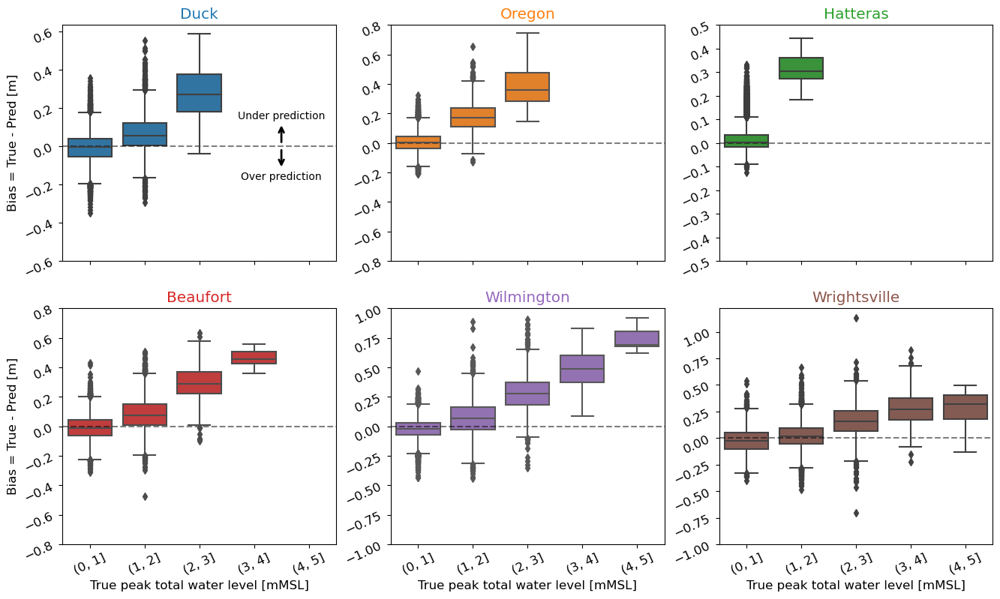

In [7]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3, sharex=True)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
letters = ['d', 'b', 'c', 'a', 'e', 'f']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides')
ymaxs = [0.6, 0.8, 0.5, 0.8, 1, 1]
dys = [0.2, 0.2, 0.1, 0.2, 0.25, 0.25]

for ist, st, l in zip(range(len(stations)), stations, letters):

    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    df['dif'] = df['y_test_true'].values - df['y_test_pred'].values
    ax = axs.flatten()[ist]
    df['y_test_true_bins'] = pd.cut(df['y_test_pred'], bins=np.arange(0, 6, 1))
    ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
    sns.boxplot(x = df['y_test_true_bins'], y = df['dif'], color=ccolors[ist], ax = ax)
    ax.set_title(f'{st}', color = ccolors[ist])
    # atext = AnchoredText(st, loc=3, frameon = True)
    # ax.add_artist(atext)
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    # if ist < 3:
    #     ax.xaxis.tick_top()
    #     ax.xaxis.set_label_position('top')
    ax.tick_params(labelrotation=25)
    # yvals = ax.get_yticks()
    # dy = yvals[-1] - yvals[-2]
    # aux = np.max(np.abs(yvals))
    ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))

# axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
ylabel = 'True peak total water level [mMSL]'
axs[1, 0].set_xlabel(ylabel)
axs[1, 1].set_xlabel(ylabel)
axs[1, 2].set_xlabel(ylabel)
# axs[0, 0].set_xlabel(ylabel)
# axs[0, 1].set_xlabel(ylabel)
# axs[0, 2].set_xlabel(ylabel)

axs[0, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
axs[1, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')


props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
# place a text box in upper left in axes coords
axs[0,0].text(3.5, 0.0, 'Under prediction\n\n\n\n\nOver prediction', fontsize=10,
        verticalalignment='center', bbox=props, horizontalalignment='center')
x_arrow = 3.5  # X-coordinate for the arrow
y_arrow = 0.12    # Y-coordinate for the arrow, between 0 and 1
arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
axs[0, 0].annotate('', xy=(x_arrow, y_arrow), xytext=(3.5, 0.01),
                  arrowprops=arrow_props)
axs[0, 0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(3.5, -0.01),
                  arrowprops=arrow_props)
fig.savefig(r'../documents/thesis/netTest_boxPlot_NOAA_offshoretide.png', dpi = 300, bbox_inches = 'tight')

#### Estuaries

In [8]:
pInd = Path(r'../models/NNmodel/inputs/random_split')
fInd = r'indices_test_standardScaled_allInputs_augmentedAllX50_estuaries.npy'
dfind = pd.read_csv(pInd/fInd, header=None, names=['ind'])
dfreal = dfind[dfind['ind'] < 1814]
dfaug = dfind[dfind['ind'] >= 1814]

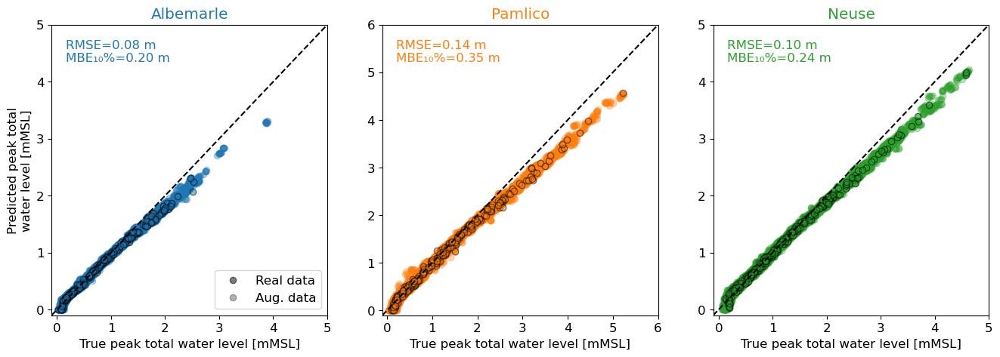

In [12]:
fig, axs = plt.subplots(figsize = (16, 5), nrows = 1, ncols = 3)
stations = ['Albemarle', 'Pamlico', 'Neuse']
letters = ['g', 'h', 'i']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides')

binsAll = []
for ist, st, l in zip(range(len(stations)), stations, letters):
    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    ax = axs.flatten()[ist]
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    ax.scatter(x = dfa['y_test_true'], y = dfa['y_test_pred'], color = ccolors[ist], alpha = 0.3)
    ax.scatter(x = dfr['y_test_true'], y = dfr['y_test_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
    dummy = ax.get_xticks()
    ax.set_xticks(dummy)
    ax.set_yticks(dummy)
    ax.set_xlim([-0.1, dummy[-1]])
    ax.set_ylim([-0.1, dummy[-1]])
    binsAll.append(dummy)
    ax.plot(dummy, dummy, color = 'k', ls = '--')
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    rmse = np.sqrt(mean_squared_error(df['y_test_true'], df['y_test_pred']))
    dummy = df.sort_values(by = 'y_test_true', ascending = False).iloc[:int(len(df)/10), :]
    mbe = mean_dif(dummy['y_test_true'], dummy['y_test_pred'])
    ax.set_title(f'{st}', color = ccolors[ist])#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
    
    ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ist])

handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
           Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
axs[0].legend(handles=handles, frameon = True, loc = 'lower right')


axs[0].set_xlabel('True peak total water level [mMSL]')
axs[1].set_xlabel('True peak total water level [mMSL]')
axs[2].set_xlabel('True peak total water level [mMSL]')
axs[0].set_ylabel('Predicted peak total\nwater level [mMSL]')
fig.savefig(r'../documents/thesis/netTest_scatter_estuaries.png', dpi = 300, bbox_inches = 'tight')

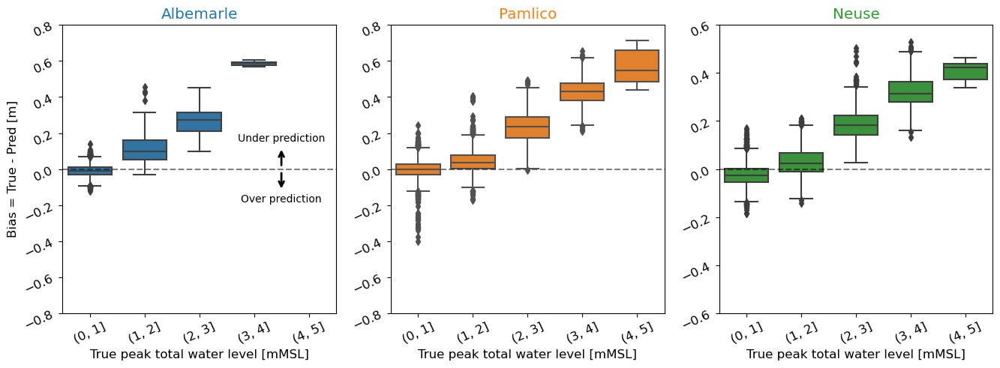

In [13]:
fig, axs = plt.subplots(figsize = (16, 5), nrows = 1, ncols = 3)
stations = ['Albemarle', 'Pamlico', 'Neuse']
letters = ['g', 'h', 'i']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides')
ymaxs = [0.8, 0.8, 0.6]
dys = [0.2, 0.2, 0.2]

for ist, st, l in zip(range(len(stations)), stations, letters):

    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    df['dif'] = df['y_test_true'].values - df['y_test_pred'].values
    ax = axs.flatten()[ist]
    df['y_test_true_bins'] = pd.cut(df['y_test_pred'], bins=np.arange(0, 6, 1))
    ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
    sns.boxplot(x = df['y_test_true_bins'], y = df['dif'], color=ccolors[ist], ax = ax)
    ax.set_title(f'{st}', color = ccolors[ist])
    # atext = AnchoredText(st, loc=3, frameon = True)
    # ax.add_artist(atext)
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    # if ist < 3:
    #     ax.xaxis.tick_top()
    #     ax.xaxis.set_label_position('top')
    ax.tick_params(labelrotation=25)
    # yvals = ax.get_yticks()
    # dy = yvals[-1] - yvals[-2]
    # aux = np.max(np.abs(yvals))
    ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))

# axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
ylabel = 'True peak total water level [mMSL]'
axs[0].set_xlabel(ylabel)
axs[1].set_xlabel(ylabel)
axs[2].set_xlabel(ylabel)
# axs[0, 0].set_xlabel(ylabel)
# axs[0, 1].set_xlabel(ylabel)
# axs[0, 2].set_xlabel(ylabel)

axs[0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
# axs[1, 0].set_ylabel('True - Pred [m]')#\nOver pred<-- | -->Under pred')


props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
# place a text box in upper left in axes coords
axs[0].text(3.5, 0.0, 'Under prediction\n\n\n\n\nOver prediction', fontsize=10,
        verticalalignment='center', bbox=props, horizontalalignment='center')
x_arrow = 3.5  # X-coordinate for the arrow
y_arrow = 0.12    # Y-coordinate for the arrow, between 0 and 1
arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
axs[0].annotate('', xy=(x_arrow, y_arrow), xytext=(3.5, 0.01),
                  arrowprops=arrow_props)
axs[0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(3.5, -0.01),
                  arrowprops=arrow_props)
fig.savefig(r'../documents/thesis/netTest_boxPlot_estuaries.png', dpi = 300, bbox_inches = 'tight')

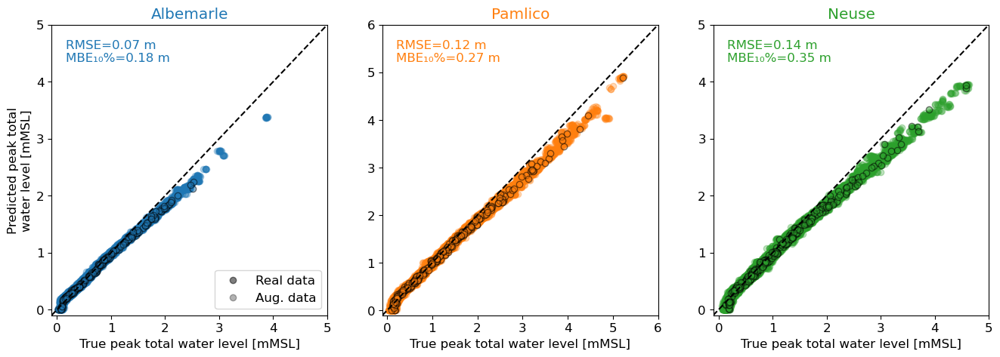

In [9]:
fig, axs = plt.subplots(figsize = (16, 5), nrows = 1, ncols = 3)
stations = ['Albemarle', 'Pamlico', 'Neuse']
letters = ['g', 'h', 'i']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides')

binsAll = []
for ist, st, l in zip(range(len(stations)), stations, letters):
    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    ax = axs.flatten()[ist]
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    ax.scatter(x = dfa['y_test_true'], y = dfa['y_test_pred'], color = ccolors[ist], alpha = 0.3)
    ax.scatter(x = dfr['y_test_true'], y = dfr['y_test_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
    dummy = ax.get_xticks()
    ax.set_xticks(dummy)
    ax.set_yticks(dummy)
    ax.set_xlim([-0.1, dummy[-1]])
    ax.set_ylim([-0.1, dummy[-1]])
    binsAll.append(dummy)
    ax.plot(dummy, dummy, color = 'k', ls = '--')
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    rmse = np.sqrt(mean_squared_error(df['y_test_true'], df['y_test_pred']))
    dummy = df.sort_values(by = 'y_test_true', ascending = False).iloc[:int(len(df)/10), :]
    mbe = mean_dif(dummy['y_test_true'], dummy['y_test_pred'])
    ax.set_title(f'{st}', color = ccolors[ist])#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
    
    ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ist])

handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
           Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
axs[0].legend(handles=handles, frameon = True, loc = 'lower right')


axs[0].set_xlabel('True peak total water level [mMSL]')
axs[1].set_xlabel('True peak total water level [mMSL]')
axs[2].set_xlabel('True peak total water level [mMSL]')
axs[0].set_ylabel('Predicted peak total\nwater level [mMSL]')
fig.savefig(r'../documents/thesis/netTest_scatter_estuaries_offshoretide.png', dpi = 300, bbox_inches = 'tight')

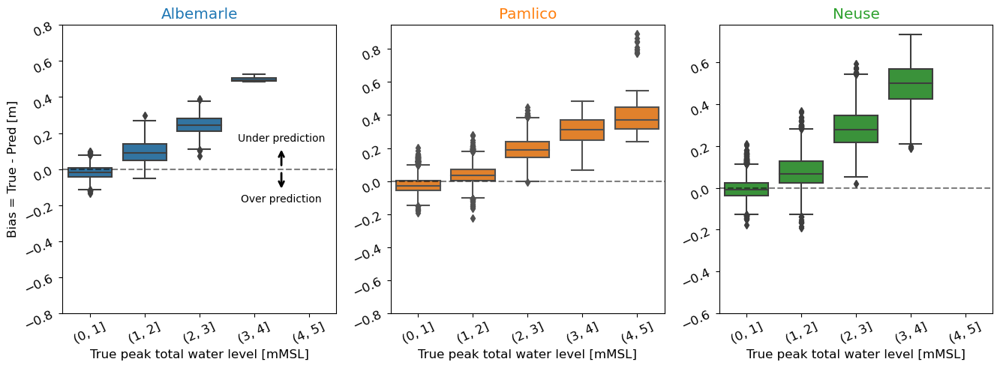

In [10]:
fig, axs = plt.subplots(figsize = (16, 5), nrows = 1, ncols = 3)
stations = ['Albemarle', 'Pamlico', 'Neuse']
letters = ['g', 'h', 'i']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides')
ymaxs = [0.8, 0.8, 0.6]
dys = [0.2, 0.2, 0.2]

for ist, st, l in zip(range(len(stations)), stations, letters):

    df = pd.read_csv(pathin/f'93{l}s'/f'predTestSet_93{l}s_{st}_nonVal.csv', index_col = 0)
    df['dif'] = df['y_test_true'].values - df['y_test_pred'].values
    ax = axs.flatten()[ist]
    df['y_test_true_bins'] = pd.cut(df['y_test_pred'], bins=np.arange(0, 6, 1))
    ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
    sns.boxplot(x = df['y_test_true_bins'], y = df['dif'], color=ccolors[ist], ax = ax)
    ax.set_title(f'{st}', color = ccolors[ist])
    # atext = AnchoredText(st, loc=3, frameon = True)
    # ax.add_artist(atext)
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    # if ist < 3:
    #     ax.xaxis.tick_top()
    #     ax.xaxis.set_label_position('top')
    ax.tick_params(labelrotation=25)
    # yvals = ax.get_yticks()
    # dy = yvals[-1] - yvals[-2]
    # aux = np.max(np.abs(yvals))
    ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))

# axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
ylabel = 'True peak total water level [mMSL]'
axs[0].set_xlabel(ylabel)
axs[1].set_xlabel(ylabel)
axs[2].set_xlabel(ylabel)
# axs[0, 0].set_xlabel(ylabel)
# axs[0, 1].set_xlabel(ylabel)
# axs[0, 2].set_xlabel(ylabel)

axs[0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
# axs[1, 0].set_ylabel('True - Pred [m]')#\nOver pred<-- | -->Under pred')


props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
# place a text box in upper left in axes coords
axs[0].text(3.5, 0.0, 'Under prediction\n\n\n\n\nOver prediction', fontsize=10,
        verticalalignment='center', bbox=props, horizontalalignment='center')
x_arrow = 3.5  # X-coordinate for the arrow
y_arrow = 0.12    # Y-coordinate for the arrow, between 0 and 1
arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
axs[0].annotate('', xy=(x_arrow, y_arrow), xytext=(3.5, 0.01),
                  arrowprops=arrow_props)
axs[0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(3.5, -0.01),
                  arrowprops=arrow_props)
fig.savefig(r'../documents/thesis/netTest_boxPlot_estuaries_offshoretide.png', dpi = 300, bbox_inches = 'tight')

#### Single model

In [59]:
pInd = Path(r'../models/NNmodel/inputs/random_split')
fInd = r'indices_test_standardScaled_allInputs_augmentedAllX50_def.npy'
dfind = pd.read_csv(pInd/fInd, header=None, names=['ind'])
dfreal = dfind[dfind['ind'] < 1814]
dfaug = dfind[dfind['ind'] >= 1814]

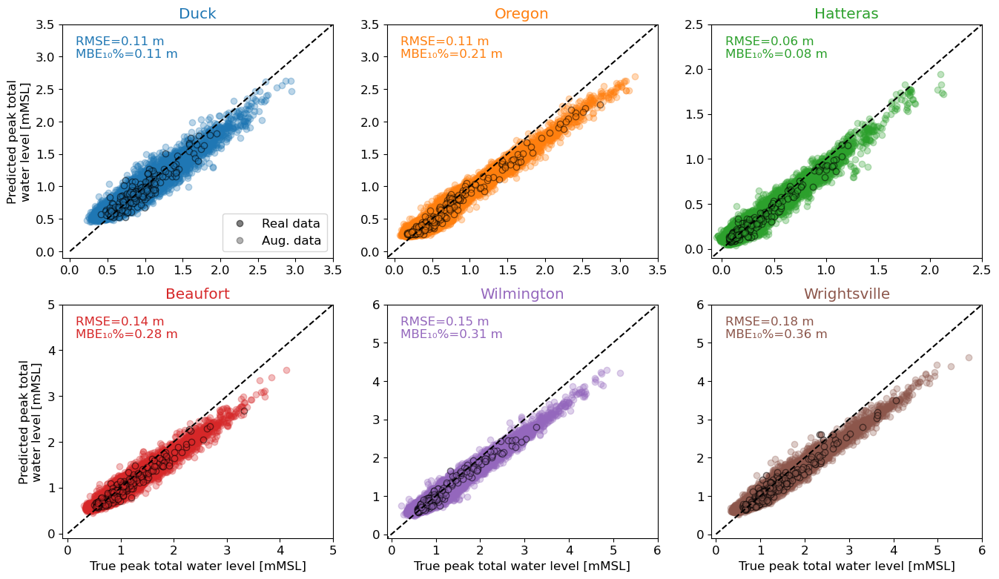

In [15]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/93js/predTestSet_93js.csv')

df = pd.read_csv(pathin, index_col = 0)
dfr = df.loc[dfreal.index, :]
dfa = df.loc[dfaug.index, :]

binsAll = []
for ist, st, in enumerate(stations):
    ax = axs.flatten()[ist]
    ax.scatter(x = dfa[f'{st}'], y = dfa[f'{st}_pred'], color = ccolors[ist], alpha = 0.3)
    ax.scatter(x = dfr[f'{st}'], y = dfr[f'{st}_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
    dummy = ax.get_xticks()
    ax.set_xticks(dummy)
    ax.set_yticks(dummy)
    ax.set_xlim([-0.1, dummy[-1]])
    ax.set_ylim([-0.1, dummy[-1]])
    # print(dummy)
    binsAll.append(dummy)
    ax.plot(dummy, dummy, color = 'k', ls = '--')
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    rmse = np.sqrt(mean_squared_error(df[f'{st}'], df[f'{st}_pred']))

    dummy = df.sort_values(by = f'{st}', ascending = False).iloc[:int(len(df)/10), :]
    mbe = mean_dif(dummy[f'{st}'], dummy[f'{st}_pred'])
    ax.set_title(f'{st}', color = ccolors[ist])#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
    
    ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ist])

handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
           Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
axs[0, 0].legend(handles=handles, frameon = True, loc = 'lower right')


axs[1, 0].set_xlabel('True peak total water level [mMSL]')
axs[1, 1].set_xlabel('True peak total water level [mMSL]')
axs[1, 2].set_xlabel('True peak total water level [mMSL]')
axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')

fig.savefig(r'../documents/thesis/netTest_scatter_1model.png', dpi = 300, bbox_inches = 'tight')

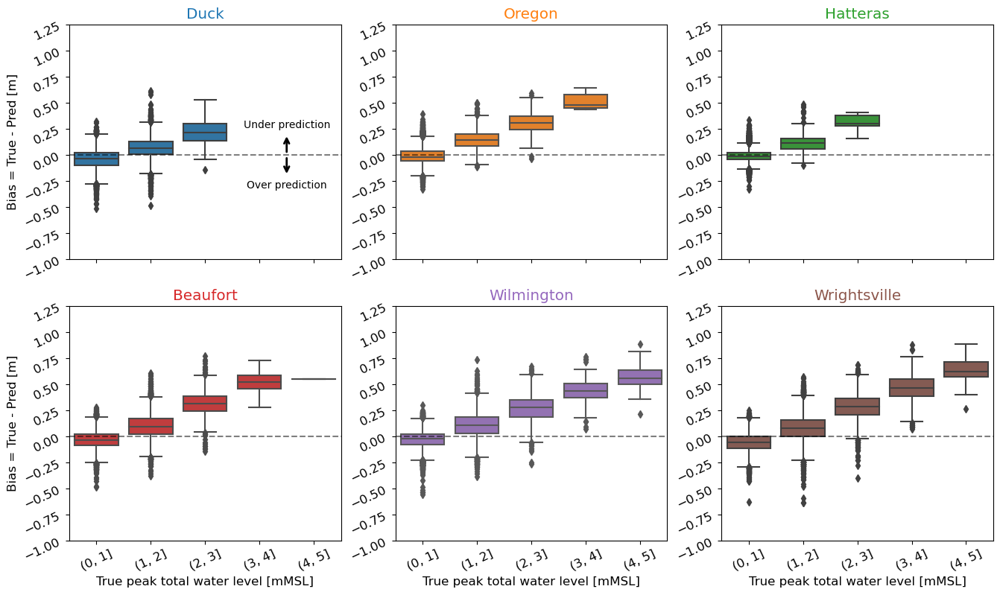

In [9]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3, sharex = True)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndLocalTides/93js/predTestSet_93js.csv')
# ymaxs = [0.6, 0.8, 0.5, 0.8, 1, 1]
# dys = [0.2, 0.2, 0.1, 0.2, 0.25, 0.25]

df = pd.read_csv(pathin, index_col = 0)
dfr = df.loc[dfreal.index, :]
dfa = df.loc[dfaug.index, :]

binsAll = []
for ist, st, in enumerate(stations):
    ax = axs.flatten()[ist]
    ax = axs.flatten()[ist]
    df[f'{st}_dif'] = df[f'{st}'].values - df[f'{st}_pred'].values
    df[f'{st}_bins'] = pd.cut(df[f'{st}'], bins=np.arange(0, 6, 1))
    ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
    sns.boxplot(x = df[f'{st}_bins'], y = df[f'{st}_dif'], color=ccolors[ist], ax = ax)
    ax.set_title(f'{st}', color = ccolors[ist])
    # atext = AnchoredText(st, loc=3, frameon = True)
    # ax.add_artist(atext)
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    ax.tick_params(labelrotation=25)
    ax.set_yticks(np.arange(-1, 1.5, 0.25))
    # ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))

# axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
ylabel = 'True peak total water level [mMSL]'
axs[1, 0].set_xlabel(ylabel)
axs[1, 1].set_xlabel(ylabel)
axs[1, 2].set_xlabel(ylabel)
# axs[0, 0].set_xlabel(ylabel)
# axs[0, 1].set_xlabel(ylabel)
# axs[0, 2].set_xlabel(ylabel)

axs[0, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
axs[1, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')


props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
# place a text box in upper left in axes coords
axs[0,0].text(3.5, 0.0, 'Under prediction\n\n\n\n\nOver prediction', fontsize=10,
        verticalalignment='center', bbox=props, horizontalalignment='center')
x_arrow = 3.5  # X-coordinate for the arrow
y_arrow = 0.2    # Y-coordinate for the arrow, between 0 and 1
arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
axs[0, 0].annotate('', xy=(x_arrow, y_arrow), xytext=(3.5, 0.01),
                  arrowprops=arrow_props)
axs[0, 0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(3.5, -0.01),
                  arrowprops=arrow_props)
fig.savefig(r'../documents/thesis/netTest_boxPlot_1model.png', dpi = 300, bbox_inches = 'tight')

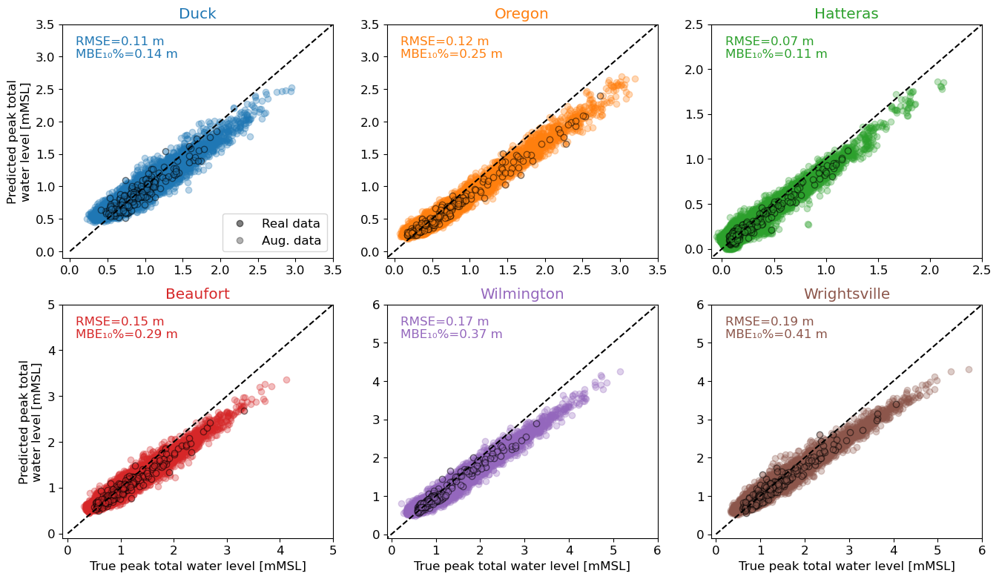

In [12]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93js/predTestSet_93js.csv')

df = pd.read_csv(pathin, index_col = 0)
dfr = df.loc[dfreal.index, :]
dfa = df.loc[dfaug.index, :]

binsAll = []
for ist, st, in enumerate(stations):
    ax = axs.flatten()[ist]
    ax.scatter(x = dfa[f'{st}'], y = dfa[f'{st}_pred'], color = ccolors[ist], alpha = 0.3)
    ax.scatter(x = dfr[f'{st}'], y = dfr[f'{st}_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
    dummy = ax.get_xticks()
    ax.set_xticks(dummy)
    ax.set_yticks(dummy)
    ax.set_xlim([-0.1, dummy[-1]])
    ax.set_ylim([-0.1, dummy[-1]])
    # print(dummy)
    binsAll.append(dummy)
    ax.plot(dummy, dummy, color = 'k', ls = '--')
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    rmse = np.sqrt(mean_squared_error(df[f'{st}'], df[f'{st}_pred']))

    dummy = df.sort_values(by = f'{st}', ascending = False).iloc[:int(len(df)/10), :]
    mbe = mean_dif(dummy[f'{st}'], dummy[f'{st}_pred'])
    ax.set_title(f'{st}', color = ccolors[ist])#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
    
    ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=12,
            verticalalignment='top', color = ccolors[ist])

handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
           Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
axs[0, 0].legend(handles=handles, frameon = True, loc = 'lower right')


axs[1, 0].set_xlabel('True peak total water level [mMSL]')
axs[1, 1].set_xlabel('True peak total water level [mMSL]')
axs[1, 2].set_xlabel('True peak total water level [mMSL]')
axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')

fig.savefig(r'../documents/thesis/netTest_scatter_1model_offshoretide.png', dpi = 300, bbox_inches = 'tight')

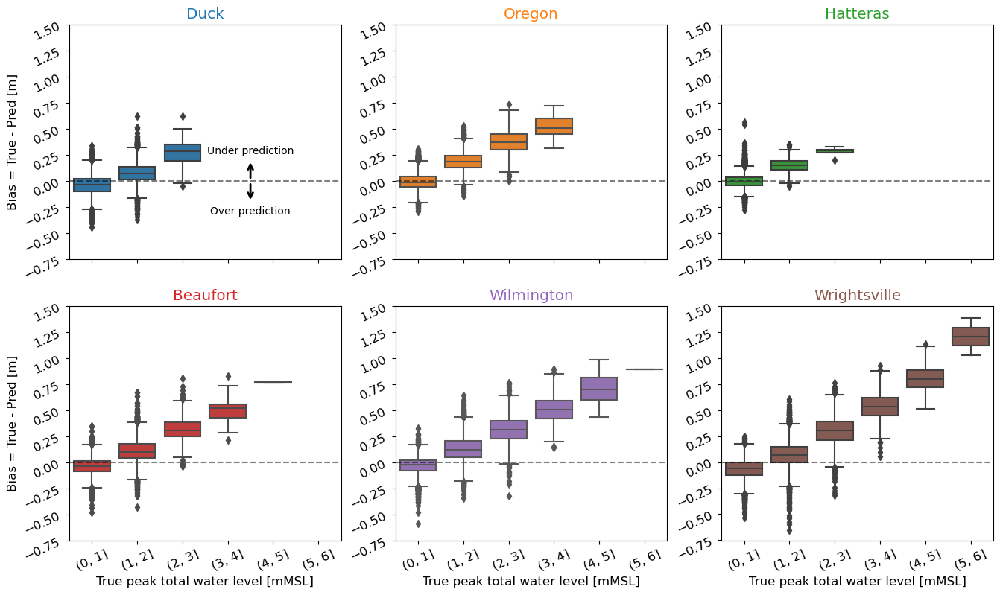

In [24]:
fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 3, sharex = True)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93js/predTestSet_93js.csv')
ymaxs = [0.6, 0.8, 0.5, 0.8, 1, 1]
dys = [0.2, 0.2, 0.1, 0.2, 0.25, 0.25]

df = pd.read_csv(pathin, index_col = 0)
dfr = df.loc[dfreal.index, :]
dfa = df.loc[dfaug.index, :]

binsAll = []
for ist, st, in enumerate(stations):
    ax = axs.flatten()[ist]
    ax = axs.flatten()[ist]
    df[f'{st}_dif'] = df[f'{st}'].values - df[f'{st}_pred'].values
    df[f'{st}_bins'] = pd.cut(df[f'{st}'], bins=np.arange(0, 7, 1))
    ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
    sns.boxplot(x = df[f'{st}_bins'], y = df[f'{st}_dif'], color=ccolors[ist], ax = ax)
    ax.set_title(f'{st}', color = ccolors[ist])
    # atext = AnchoredText(st, loc=3, frameon = True)
    # ax.add_artist(atext)
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    ax.tick_params(labelrotation=25)
    # ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))
    ax.set_yticks(np.arange(-0.75, 1.75, 0.25))

# axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
ylabel = 'True peak total water level [mMSL]'
axs[1, 0].set_xlabel(ylabel)
axs[1, 1].set_xlabel(ylabel)
axs[1, 2].set_xlabel(ylabel)
# axs[0, 0].set_xlabel(ylabel)
# axs[0, 1].set_xlabel(ylabel)
# axs[0, 2].set_xlabel(ylabel)

axs[0, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
axs[1, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')


props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
# place a text box in upper left in axes coords
axs[0,0].text(3.5, 0.0, 'Under prediction\n\n\n\n\nOver prediction', fontsize=10,
        verticalalignment='center', bbox=props, horizontalalignment='center')
x_arrow = 3.5  # X-coordinate for the arrow
y_arrow = 0.2    # Y-coordinate for the arrow, between 0 and 1
arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
axs[0, 0].annotate('', xy=(x_arrow, y_arrow), xytext=(3.5, 0.01),
                  arrowprops=arrow_props)
axs[0, 0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(3.5, -0.01),
                  arrowprops=arrow_props)
fig.savefig(r'../documents/thesis/netTest_boxPlot_1model_offshoretide.png', dpi = 300, bbox_inches = 'tight')

In [25]:
pInd = Path(r'../models/NNmodel/inputs/random_split')
fInd = r'indices_test_standardScaled_allInputs_augmentedAllX50_ALL.txt'
dfind = pd.read_csv(pInd/fInd, header=None, names=['ind'])
dfreal = dfind[dfind['ind'] < 1814]
dfaug = dfind[dfind['ind'] >= 1814]

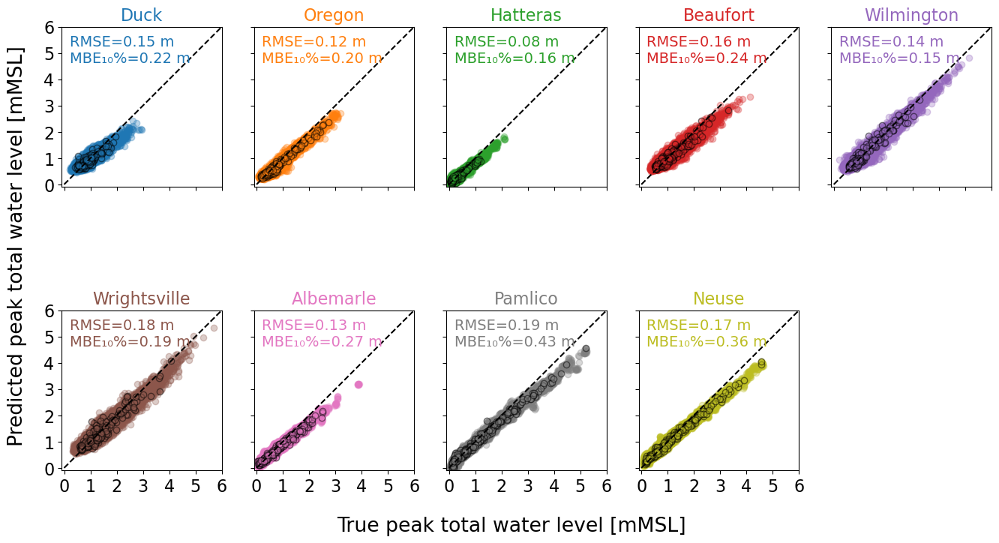

In [15]:
with plt.rc_context({'font.size': 16}):
    fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 5, sharex = True, sharey = True)
    stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93ks/predTestSet_93ks.csv')

    df = pd.read_csv(pathin, index_col = 0)
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    rmse_subscript = 'MBE\u2081\u2080\u0025'
    binsAll = []
    for ist, st, in enumerate(stations):
        ax = axs.flatten()[ist]
        ax.scatter(x = dfa[f'{st}'], y = dfa[f'{st}_pred'], color = ccolors[ist], alpha = 0.3)
        ax.scatter(x = dfr[f'{st}'], y = dfr[f'{st}_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
        dummy = ax.get_xticks()
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 7, 1))
        ax.set_xlim([-0.1, 6])
        ax.set_ylim([-0.1, 6])
        # print(dummy)
        binsAll.append(dummy)
        ax.plot(np.arange(0, 7, 1), np.arange(0, 7, 1), color = 'k', ls = '--')
        ax.set_xlabel(' ')
        ax.set_ylabel(' ')
        rmse = np.sqrt(mean_squared_error(df[f'{st}'], df[f'{st}_pred']))

        dummy = df.sort_values(by = f'{st}', ascending = False).iloc[:int(len(df)/10), :]
        mbe = mean_dif(dummy[f'{st}'], dummy[f'{st}_pred'])
        ax.set_title(f'{st}', color = ccolors[ist], fontsize = 16)#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
        
        ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=14,
                verticalalignment='top', color = ccolors[ist])
        ax.set_aspect('equal')

    handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
            Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
    # axs[0, 0].legend(handles=handles, frameon = True, loc = 'lower right', fontsize = 16)
    
    axs[1, 4].axes.get_yaxis().set_visible(False)
    axs[1, 4].axes.get_xaxis().set_visible(False)
    axs[1, 4].spines['right'].set_visible(False)
    axs[1, 4].spines['left'].set_visible(False)
    axs[1, 4].spines['bottom'].set_visible(False)
    axs[1, 4].spines['top'].set_visible(False)
    fig.supxlabel('True peak total water level [mMSL]', y=0.07)
    fig.supylabel('Predicted peak total water level [mMSL]', x = 0.08)
    plt.show()
    # axs[2, 0].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 1].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 2].set_xlabel('True peak total water level [mMSL]')
    # axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[2, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # plt.show()

fig.savefig(r'../documents/defense/netTest_scatter_1model_offshoretide_ALL_nolegend2.png', dpi = 300, bbox_inches = 'tight')

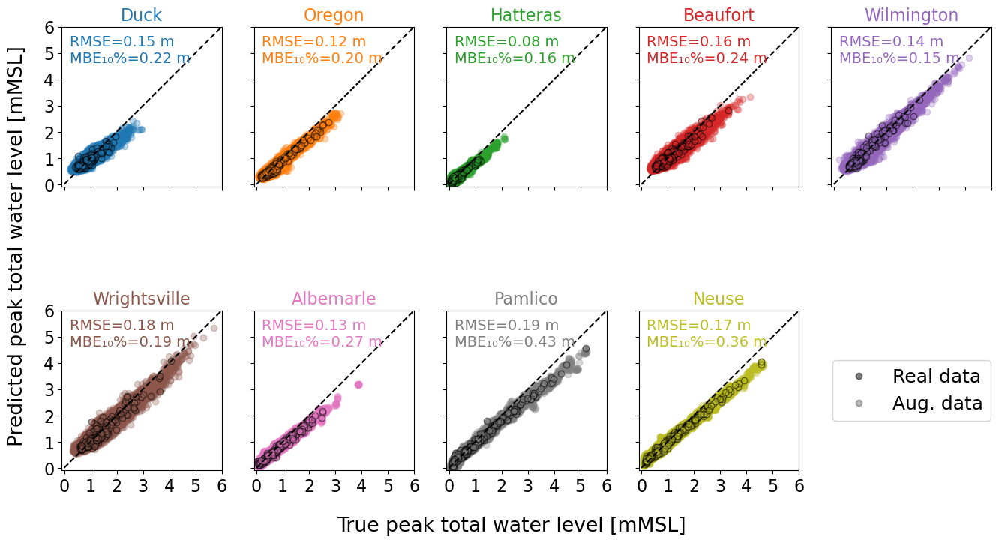

In [18]:
with plt.rc_context({'font.size': 16}):
    fig, axs = plt.subplots(figsize = (16, 9), nrows = 2, ncols = 5, sharex = True, sharey = True)
    stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93ks/predTestSet_93ks.csv')

    df = pd.read_csv(pathin, index_col = 0)
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    rmse_subscript = 'MBE\u2081\u2080\u0025'
    binsAll = []
    for ist, st, in enumerate(stations):
        ax = axs.flatten()[ist]
        ax.scatter(x = dfa[f'{st}'], y = dfa[f'{st}_pred'], color = ccolors[ist], alpha = 0.3)
        ax.scatter(x = dfr[f'{st}'], y = dfr[f'{st}_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
        dummy = ax.get_xticks()
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 7, 1))
        ax.set_xlim([-0.1, 6])
        ax.set_ylim([-0.1, 6])
        # print(dummy)
        binsAll.append(dummy)
        ax.plot(np.arange(0, 7, 1), np.arange(0, 7, 1), color = 'k', ls = '--')
        ax.set_xlabel(' ')
        ax.set_ylabel(' ')
        rmse = np.sqrt(mean_squared_error(df[f'{st}'], df[f'{st}_pred']))

        dummy = df.sort_values(by = f'{st}', ascending = False).iloc[:int(len(df)/10), :]
        mbe = mean_dif(dummy[f'{st}'], dummy[f'{st}_pred'])
        ax.set_title(f'{st}', color = ccolors[ist], fontsize = 16)#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
        
        ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=14,
                verticalalignment='top', color = ccolors[ist])
        ax.set_aspect('equal')

    handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.5, markeredgecolor = 'k', ls = ' '),
            Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
    axs[1, 4].legend(handles=handles, frameon = True, loc = 'center', fontsize = 18)
    
    axs[1, 4].axes.get_yaxis().set_visible(False)
    axs[1, 4].axes.get_xaxis().set_visible(False)
    axs[1, 4].spines['right'].set_visible(False)
    axs[1, 4].spines['left'].set_visible(False)
    axs[1, 4].spines['bottom'].set_visible(False)
    axs[1, 4].spines['top'].set_visible(False)
    fig.supxlabel('True peak total water level [mMSL]', y=0.07)
    fig.supylabel('Predicted peak total water level [mMSL]', x = 0.08)
    plt.show()
    # axs[2, 0].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 1].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 2].set_xlabel('True peak total water level [mMSL]')
    # axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[2, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # plt.show()

fig.savefig(r'../documents/defense/netTest_scatter_1model_offshoretide_ALL2.png', dpi = 300, bbox_inches = 'tight')

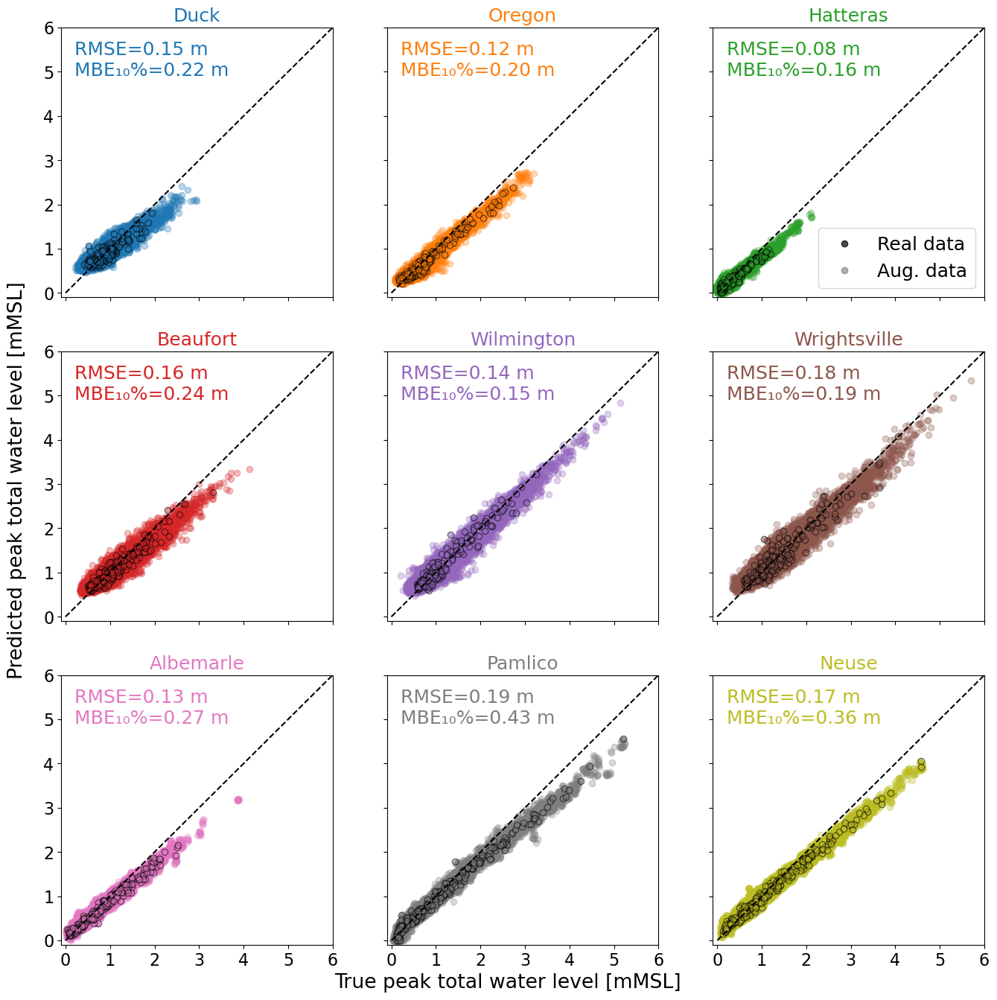

In [27]:
with plt.rc_context({'font.size': 16}):
    fig, axs = plt.subplots(figsize = (16, 16), nrows = 3, ncols = 3, sharex = True, sharey = True)
    stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93ks/predTestSet_93ks.csv')

    df = pd.read_csv(pathin, index_col = 0)
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    rmse_subscript = 'MBE\u2081\u2080\u0025'
    binsAll = []
    for ist, st, in enumerate(stations):
        ax = axs.flatten()[ist]
        ax.scatter(x = dfa[f'{st}'], y = dfa[f'{st}_pred'], color = ccolors[ist], alpha = 0.3)
        ax.scatter(x = dfr[f'{st}'], y = dfr[f'{st}_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
        dummy = ax.get_xticks()
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 7, 1))
        ax.set_xlim([-0.1, 6])
        ax.set_ylim([-0.1, 6])
        # print(dummy)
        binsAll.append(dummy)
        ax.plot(np.arange(0, 7, 1), np.arange(0, 7, 1), color = 'k', ls = '--')
        ax.set_xlabel(' ')
        ax.set_ylabel(' ')
        rmse = np.sqrt(mean_squared_error(df[f'{st}'], df[f'{st}_pred']))

        dummy = df.sort_values(by = f'{st}', ascending = False).iloc[:int(len(df)/10), :]
        mbe = mean_dif(dummy[f'{st}'], dummy[f'{st}_pred'])
        ax.set_title(f'{st}', color = ccolors[ist], fontsize = 18)#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
        
        ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=18,
                verticalalignment='top', color = ccolors[ist])

    handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.7, markeredgecolor = 'k', ls = ' '),
            Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
    axs[0, 2].legend(handles=handles, frameon = True, loc = 'lower right', fontsize = 18)

    fig.supxlabel('True peak total water level [mMSL]', y=0.07)
    fig.supylabel('Predicted peak total water level [mMSL]', x = 0.08)
    # axs[2, 0].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 1].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 2].set_xlabel('True peak total water level [mMSL]')
    # axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[2, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    plt.show()

fig.savefig(r'../documents/defense/netTest_scatter_1model_offshoretide_ALL.png', dpi = 300, bbox_inches = 'tight')

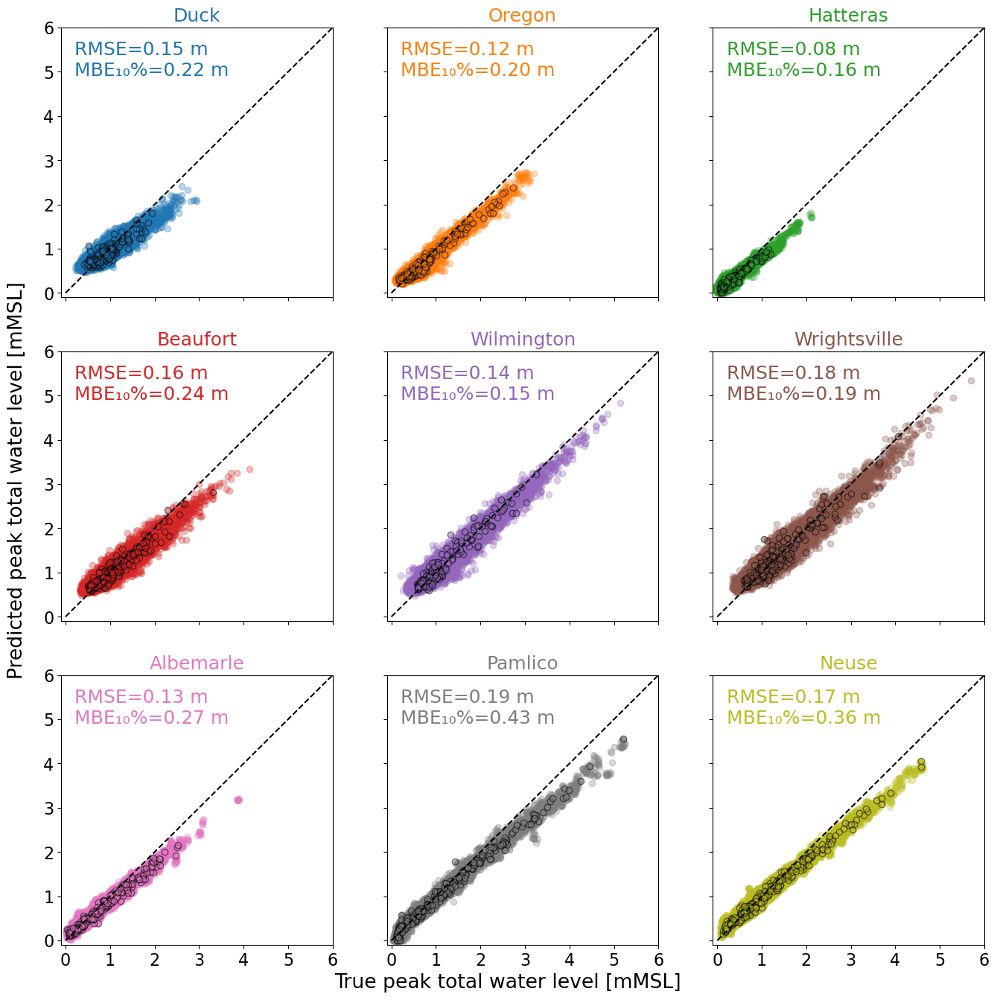

In [28]:
with plt.rc_context({'font.size': 16}):
    fig, axs = plt.subplots(figsize = (16, 16), nrows = 3, ncols = 3, sharex = True, sharey = True)
    stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93ks/predTestSet_93ks.csv')

    df = pd.read_csv(pathin, index_col = 0)
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]
    rmse_subscript = 'MBE\u2081\u2080\u0025'
    binsAll = []
    for ist, st, in enumerate(stations):
        ax = axs.flatten()[ist]
        ax.scatter(x = dfa[f'{st}'], y = dfa[f'{st}_pred'], color = ccolors[ist], alpha = 0.3)
        ax.scatter(x = dfr[f'{st}'], y = dfr[f'{st}_pred'], color = ccolors[ist], alpha = 0.5, edgecolor='k')
        dummy = ax.get_xticks()
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 7, 1))
        ax.set_xlim([-0.1, 6])
        ax.set_ylim([-0.1, 6])
        # print(dummy)
        binsAll.append(dummy)
        ax.plot(np.arange(0, 7, 1), np.arange(0, 7, 1), color = 'k', ls = '--')
        ax.set_xlabel(' ')
        ax.set_ylabel(' ')
        rmse = np.sqrt(mean_squared_error(df[f'{st}'], df[f'{st}_pred']))

        dummy = df.sort_values(by = f'{st}', ascending = False).iloc[:int(len(df)/10), :]
        mbe = mean_dif(dummy[f'{st}'], dummy[f'{st}_pred'])
        ax.set_title(f'{st}', color = ccolors[ist], fontsize = 18)#: RMSE = {rmse:0.2f} m', color = ccolors[ist])
        
        ax.text(0.05, 0.95, f'RMSE={rmse:0.2f} m\n{rmse_subscript}={mbe:0.2f} m', transform=ax.transAxes, fontsize=18,
                verticalalignment='top', color = ccolors[ist])

    handles = [Line2D([0], [0], color='k', label = 'Real data', marker = 'o', alpha = 0.7, markeredgecolor = 'k', ls = ' '),
            Line2D([0], [0], color='k', label = 'Aug. data', marker = 'o', alpha = 0.3, ls = ' ')]
    # axs[0, 2].legend(handles=handles, frameon = True, loc = 'lower right', fontsize = 18)

    fig.supxlabel('True peak total water level [mMSL]', y=0.07)
    fig.supylabel('Predicted peak total water level [mMSL]', x = 0.08)
    # axs[2, 0].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 1].set_xlabel('True peak total water level [mMSL]')
    # axs[2, 2].set_xlabel('True peak total water level [mMSL]')
    # axs[0, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[1, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    # axs[2, 0].set_ylabel('Predicted peak total\nwater level [mMSL]')
    plt.show()

fig.savefig(r'../documents/defense/netTest_scatter_1model_offshoretide_ALL_nolegend.png', dpi = 300, bbox_inches = 'tight')

Text(4.5, -0.01, '')

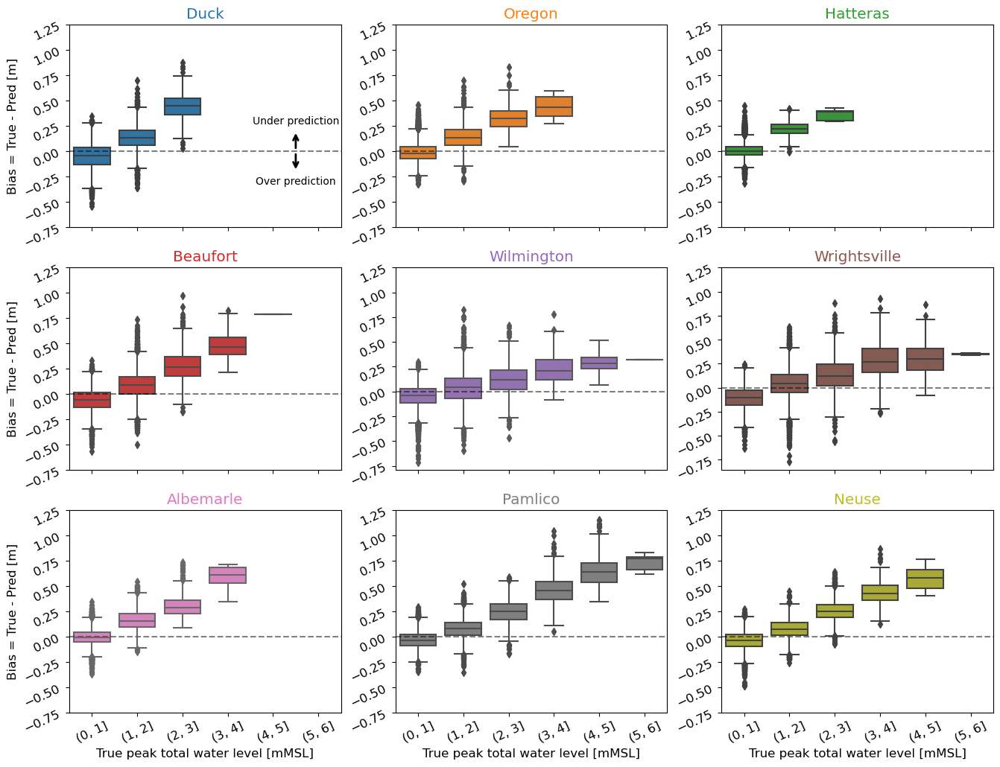

In [9]:
fig, axs = plt.subplots(figsize = (16, 12), nrows = 3, ncols = 3, sharex = True)
stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93ks/predTestSet_93ks.csv')
ymaxs = [0.6, 0.8, 0.5, 0.8, 1, 1]
dys = [0.2, 0.2, 0.1, 0.2, 0.25, 0.25]

df = pd.read_csv(pathin, index_col = 0)
dfr = df.loc[dfreal.index, :]
dfa = df.loc[dfaug.index, :]

binsAll = []
for ist, st, in enumerate(stations):
    ax = axs.flatten()[ist]
    ax = axs.flatten()[ist]
    df[f'{st}_dif'] = df[f'{st}'].values - df[f'{st}_pred'].values
    df[f'{st}_bins'] = pd.cut(df[f'{st}'], bins=np.arange(0, 7, 1))
    ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
    sns.boxplot(x = df[f'{st}_bins'], y = df[f'{st}_dif'], color=ccolors[ist], ax = ax)
    ax.set_title(f'{st}', color = ccolors[ist])
    # atext = AnchoredText(st, loc=3, frameon = True)
    # ax.add_artist(atext)
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    ax.tick_params(labelrotation=25)
    # ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))
    ax.set_yticks(np.arange(-0.75, 1.5, 0.25))

# axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
ylabel = 'True peak total water level [mMSL]'
axs[2, 0].set_xlabel(ylabel)
axs[2, 1].set_xlabel(ylabel)
axs[2, 2].set_xlabel(ylabel)
# axs[0, 0].set_xlabel(ylabel)
# axs[0, 1].set_xlabel(ylabel)
# axs[0, 2].set_xlabel(ylabel)

axs[0, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
axs[1, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')
axs[2, 0].set_ylabel('Bias = True - Pred [m]')#\nOver pred<-- | -->Under pred')


props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
# place a text box in upper left in axes coords
axs[0,0].text(4.5, 0.0, 'Under prediction\n\n\n\n\nOver prediction', fontsize=10,
        verticalalignment='center', bbox=props, horizontalalignment='center')
x_arrow = 4.5  # X-coordinate for the arrow
y_arrow = 0.2    # Y-coordinate for the arrow, between 0 and 1
arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
axs[0, 0].annotate('', xy=(x_arrow, y_arrow), xytext=(4.5, 0.01),
                  arrowprops=arrow_props)
axs[0, 0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(4.5, -0.01),
                  arrowprops=arrow_props)
# fig.savefig(r'../documents/thesis/netTest_boxPlot_1model_offshoretide_ALL.png', dpi = 300, bbox_inches = 'tight')

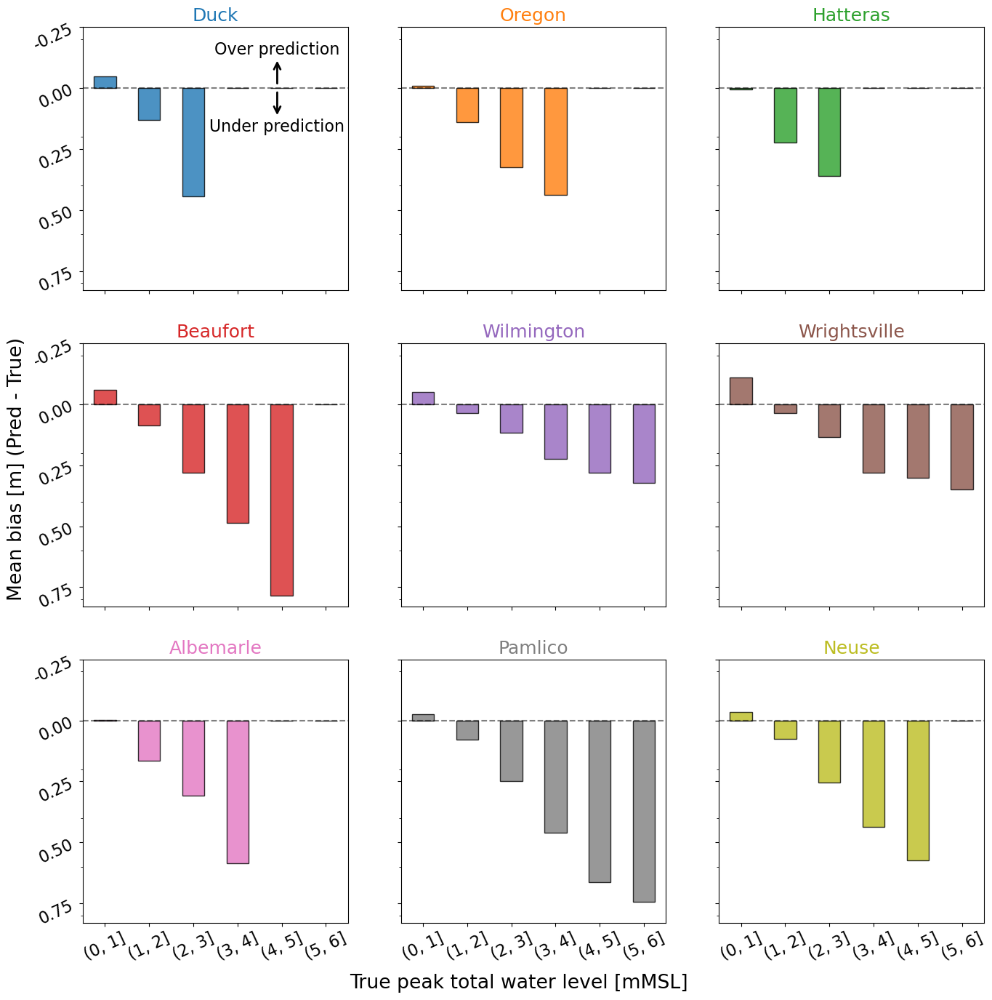

In [29]:
with plt.rc_context({'font.size': 16}):
    fig, axs = plt.subplots(figsize = (16, 16), nrows = 3, ncols = 3, sharex = True, sharey = True)
    stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93ks/predTestSet_93ks.csv')
    ymaxs = [0.6, 0.8, 0.5, 0.8, 1, 1]
    dys = [0.2, 0.2, 0.1, 0.2, 0.25, 0.25]

    df = pd.read_csv(pathin, index_col = 0)
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]

    binsAll = []
    for ist, st, in enumerate(stations):
        ax = axs.flatten()[ist]
        ax = axs.flatten()[ist]
        df[f'{st}_dif'] = df[f'{st}_pred'].values - df[f'{st}'].values
        df[f'{st}_bins'] = pd.cut(df[f'{st}'], bins=np.arange(0, 7, 1))
        ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
        aux = df.loc[:, [x for x in df.columns if x.startswith(f'{st}')]].groupby(f'{st}_bins')[f'{st}_dif'].mean()
        aux.plot(kind = 'bar', ax = ax, color=ccolors[ist], edgecolor = 'k', alpha = 0.8)
        # sns.boxplot(x = df[f'{st}_bins'], y = df[f'{st}_dif'], color=ccolors[ist], ax = ax)
        ax.set_title(f'{st}', color = ccolors[ist], fontsize = 18)
        # atext = AnchoredText(st, loc=3, frameon = True)
        # ax.add_artist(atext)
        ax.set_xlabel(' ')
        ax.set_ylabel(' ')
        ax.tick_params(labelrotation=25)
        # ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))
        ax.set_yticks(np.arange(-0.75, 0.5, 0.25))
        # ax.set_yticklabels([f'{-1*x:0.2f}' for x in ax.get_yticks()])
        ax.set_yticklabels([f'{x:0.2f}' for x in np.arange(0.75, -0.5, -0.25)])

    # axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
    # xlabel = 'True peak total water level [mMSL]'
    # axs[2, 0].set_xlabel(xlabel)
    # axs[2, 1].set_xlabel(xlabel)
    # axs[2, 2].set_xlabel(xlabel)
    # axs[0, 0].set_xlabel(xlabel)
    # axs[0, 1].set_xlabel(xlabel)
    # axs[0, 2].set_xlabel(xlabel)

    # ylabel = 'Mean bias [m]\n(True - Pred)'
    # axs[0, 0].set_ylabel(ylabel)#\nOver pred<-- | -->Under pred')
    # axs[1, 0].set_ylabel(ylabel)#\nOver pred<-- | -->Under pred')
    # axs[2, 0].set_ylabel(ylabel)#\nOver pred<-- | -->Under pred')
    
    ylabel = 'Mean bias [m] (Pred - True)'
    xlabel = 'True peak total water level [mMSL]'
    fig.supxlabel(xlabel, y=0.05)
    fig.supylabel(ylabel, x = 0.06)



    props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
    # place a text box in upper left in axes coords
    x_arrow = 3.9  # X-coordinate for the arrow
    y_arrow = 0.12    # Y-coordinate for the arrow, between 0 and 1
    axs[0,0].text(x_arrow, 0.0, 'Over prediction\n\n\n\nUnder prediction', fontsize=16,
            verticalalignment='center', bbox=props, horizontalalignment='center')
    arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
    axs[0, 0].annotate('', xy=(x_arrow, y_arrow), xytext=(x_arrow, 0.01),
                    arrowprops=arrow_props)
    axs[0, 0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(x_arrow, -0.01),
                    arrowprops=arrow_props)
    plt.show()
fig.savefig(r'../documents/defense/netTest_barPlot_1model_offshoretide_ALL.png', dpi = 300, bbox_inches = 'tight')

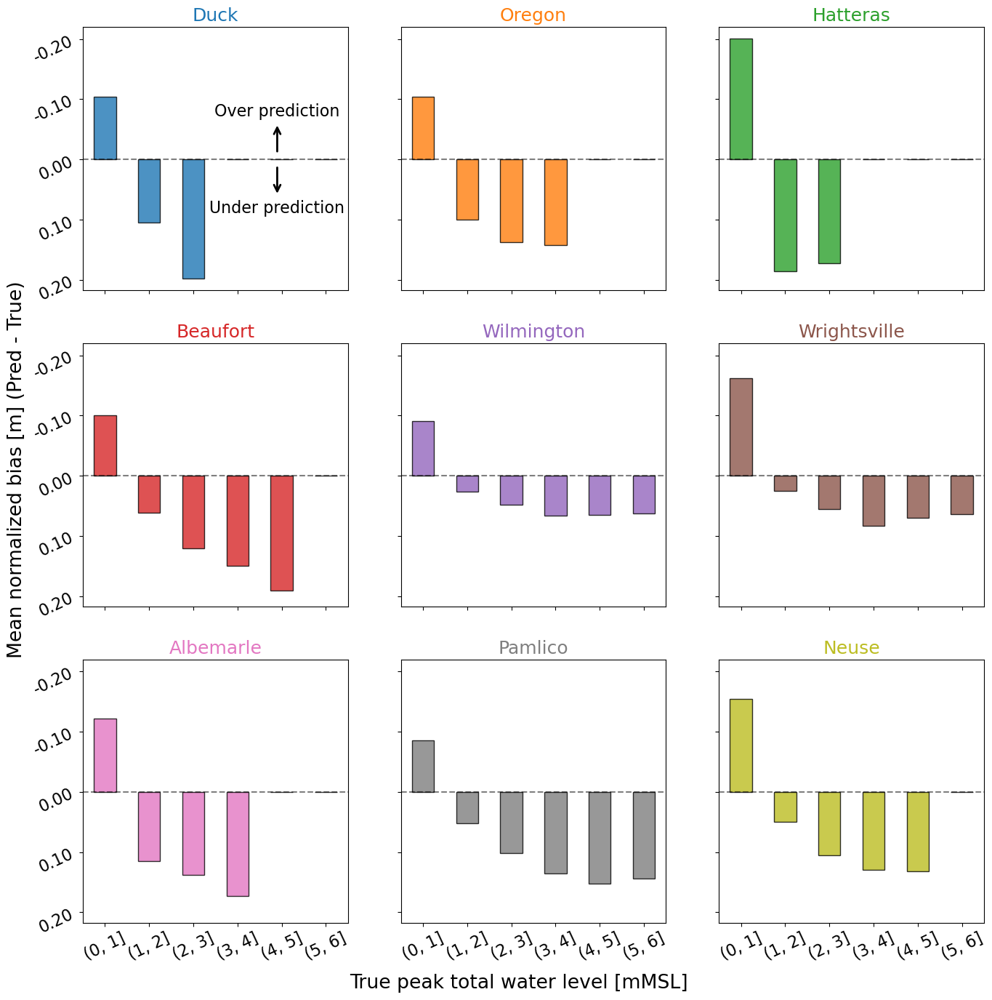

In [30]:
with plt.rc_context({'font.size': 16}):
    fig, axs = plt.subplots(figsize = (16, 16), nrows = 3, ncols = 3, sharex = True, sharey = True)
    stations = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    pathin = Path(r'../models/NNmodel/1DCNN_final_architecture/fftAndOffshoreTides/93ks/predTestSet_93ks.csv')
    ymaxs = [0.6, 0.8, 0.5, 0.8, 1, 1]
    dys = [0.2, 0.2, 0.1, 0.2, 0.25, 0.25]

    df = pd.read_csv(pathin, index_col = 0)
    dfr = df.loc[dfreal.index, :]
    dfa = df.loc[dfaug.index, :]

    binsAll = []
    for ist, st, in enumerate(stations):
        ax = axs.flatten()[ist]
        ax = axs.flatten()[ist]
        df[f'{st}_dif'] = (df[f'{st}_pred'].values - df[f'{st}'].values) / df[f'{st}'].values
        df[f'{st}_bins'] = pd.cut(df[f'{st}'], bins=np.arange(0, 7, 1))
        ax.axhline(y=0, color = 'k', alpha = 0.5, ls = '--')
        aux = df.loc[:, [x for x in df.columns if x.startswith(f'{st}')]].groupby(f'{st}_bins')[f'{st}_dif'].mean()
        aux.plot(kind = 'bar', ax = ax, color=ccolors[ist], edgecolor = 'k', alpha = 0.8)
        # sns.boxplot(x = df[f'{st}_bins'], y = df[f'{st}_dif'], color=ccolors[ist], ax = ax)
        ax.set_title(f'{st}', color = ccolors[ist], fontsize = 18)
        # atext = AnchoredText(st, loc=3, frameon = True)
        # ax.add_artist(atext)
        ax.set_xlabel(' ')
        ax.set_ylabel(' ')
        ax.tick_params(labelrotation=25)
        # ax.set_yticks(np.arange(-1*ymaxs[ist], ymaxs[ist] + dys[ist], dys[ist]))
        ax.set_yticks(np.arange(-0.2, 0.3, 0.1))
        ax.set_yticklabels([f'{x:0.2f}' for x in np.arange(0.2, -0.3, -0.1)])


    # axs[0, 0].tick_params(axis = 'x', top = True, bottom = False)
    # xlabel = 'True peak total water level [mMSL]'
    # axs[2, 0].set_xlabel(xlabel)
    # axs[2, 1].set_xlabel(xlabel)
    # axs[2, 2].set_xlabel(xlabel)
    # axs[0, 0].set_xlabel(xlabel)
    # axs[0, 1].set_xlabel(xlabel)
    # axs[0, 2].set_xlabel(xlabel)

    # ylabel = 'Mean bias [m]\n(True - Pred)'
    # axs[0, 0].set_ylabel(ylabel)#\nOver pred<-- | -->Under pred')
    # axs[1, 0].set_ylabel(ylabel)#\nOver pred<-- | -->Under pred')
    # axs[2, 0].set_ylabel(ylabel)#\nOver pred<-- | -->Under pred')
    
    ylabel = 'Mean normalized bias [m] (Pred - True)'
    xlabel = 'True peak total water level [mMSL]'
    fig.supxlabel(xlabel, y=0.05)
    fig.supylabel(ylabel, x = 0.06)


    props = dict(boxstyle='round', facecolor = 'white', alpha = 0)
    # place a text box in upper left in axes coords
    x_arrow = 3.9  # X-coordinate for the arrow
    y_arrow = 0.06    # Y-coordinate for the arrow, between 0 and 1
    axs[0,0].text(x_arrow, 0.0, 'Over prediction\n\n\n\n\nUnder prediction', fontsize=16,
            verticalalignment='center', bbox=props, horizontalalignment='center')
    arrow_props = dict(facecolor='k', edgecolor='k', arrowstyle='->', linewidth=2)
    axs[0, 0].annotate('', xy=(x_arrow, y_arrow), xytext=(x_arrow, 0.01),
                    arrowprops=arrow_props)
    axs[0, 0].annotate('', xy=(x_arrow, -1*y_arrow), xytext=(x_arrow, -0.01),
                    arrowprops=arrow_props)
    plt.show()
fig.savefig(r'../documents/defense/netTest_barPlot_1model_offshoretide_ALL_norm.png', dpi = 300, bbox_inches = 'tight')

## Track perturbations

In [2]:
path = Path(r'../data/tracks/climada')
with open(path/'tracksNC_with100perturbations.pkl', 'rb') as handle:
    dctTracks = pickle.load(handle)

In [3]:
cmap = plt.cm.viridis
norm = colors.BoundaryNorm(np.arange(0, 7, 1), cmap.N)

In [4]:
dfhind = dctTracks['FLORENCE'].resample('10min').interpolate(method = 'linear')
dfhind['cat'] = [ssScale(x/1.94384) for x in dfhind['max_sustained_wind'].values]

In [19]:
import geopandas as gpd
from shapely.geometry import LineString

In [27]:
gdf = []
track = []
pert = []
for k in dctTracks.keys():
    dummy = dctTracks[k]
    for i in range(100):
        dummy1 = dummy.loc[:, [x for x in dummy.columns if x.endswith(f'_pert{i:03d}')]]
        ls = LineString(list(zip(dummy1.iloc[:, 0], dummy1.iloc[:, 1])))
        gdf.append(ls)
        track.append(f'{k}')
        pert.append(f'pert{i:03d}')
gdf = gpd.GeoDataFrame(geometry = gdf, crs = 4326)
gdf['track'] = track
gdf['pert'] = pert

In [28]:
gdf.to_file(r'/home/tomas/Insync/tacuevas@ncsu.edu/Google Drive/NCSU/thesis/gis/gpkg/track_perturbations.gpkg', driver = 'GPKG')

In [20]:
with plt.rc_context({'font.size': 16}):
    dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    fig, ax = plt.subplots(figsize = (16, 9), 
                        subplot_kw={'projection': ccrs.PlateCarree()}, 
                        constrained_layout=True)

    dfworld.boundary.plot(ax = ax, color = 'k')
    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--') # show coordinates and grig
    gl.top_labels = False
    gl.right_labels = False
    ax.add_feature(cfeature.LAND)
    # ax.add_feature(cfeature.LAKES)
    # ax.add_feature(cfeature.RIVERS)
    ax.add_feature(cfeature.COASTLINE,lw=0.25)


    for i in range(1, 101):
        ax.scatter(dfhind[f'lon_pert{i:03d}'], dfhind[f'lat_pert{i:03d}'], c = dfhind['cat'], 
                    cmap = cmap, norm = norm, s = 0.05, alpha = 0.2)


    ax.scatter(dfhind['lon'], dfhind['lat'], c = dfhind['cat'], 
                    cmap = cmap, norm = norm, s = 5, alpha = 1.0)

    ax.set_xlim([-108, 1])
    ax.set_ylim([2, 61])
    ax.set_aspect('equal')
    ax.set_xlabel('Longitude [deg]')
    ax.set_ylabel('Latitude [deg]')
    ax.set_aspect('equal')


    fig = ax.get_figure()
    cax = fig.add_axes([0.07, 0.85, 0.15, 0.02])
    sm = plt.cm.ScalarMappable(cmap = cmap, norm = norm)
    sm._A = []
    cb = fig.colorbar(sm, cax = cax, label = 'Saffir - Simpson Wind Scale', orientation = 'horizontal')
    loc = np.arange(0, 6, 1) + .5
    cb.set_ticks(loc)
    cb.set_ticklabels(np.arange(0, 6, 1))

    fig.savefig(r'../documents/defense/florence_perturbations.png', dpi = 300, bbox_inches = 'tight')

/tmp/ipykernel_91083/1218512562.py:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


/tmp/ipykernel_36828/3572805855.py:4: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


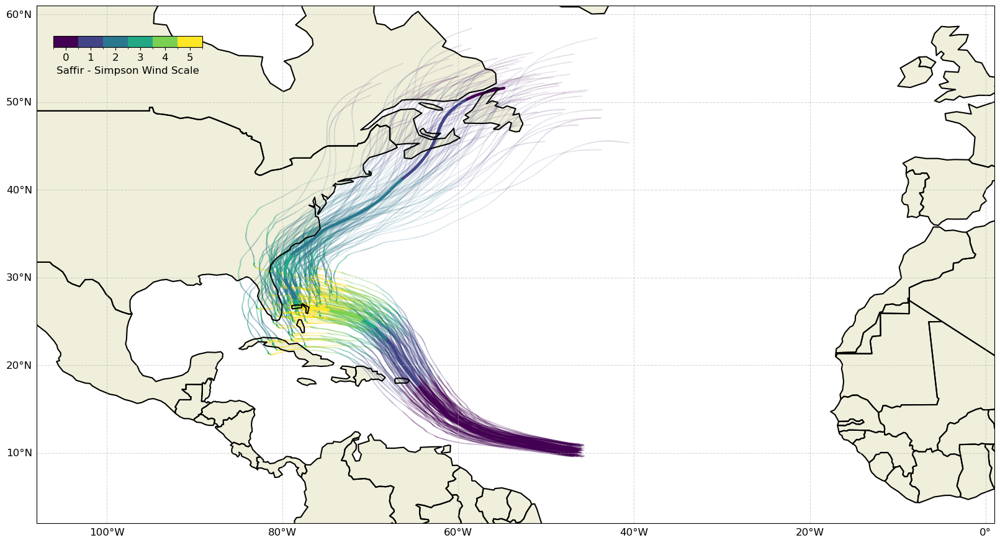

In [29]:
dfhind = dctTracks['DORIAN'].resample('10min').interpolate(method = 'linear')
dfhind['cat'] = [ssScale(x/1.94384) for x in dfhind['max_sustained_wind'].values]

dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize = (16, 9), 
                       subplot_kw={'projection': ccrs.PlateCarree()}, 
                       constrained_layout=True)

dfworld.boundary.plot(ax = ax, color = 'k')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--') # show coordinates and grig
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cfeature.LAND)
# ax.add_feature(cfeature.LAKES)
# ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE,lw=0.25)


for i in range(1, 101):
    ax.scatter(dfhind[f'lon_pert{i:03d}'], dfhind[f'lat_pert{i:03d}'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 0.05, alpha = 0.2)


ax.scatter(dfhind['lon'], dfhind['lat'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 5, alpha = 1.0)

ax.set_xlim([-108, 1])
ax.set_ylim([2, 61])
ax.set_aspect('equal')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.set_aspect('equal')


fig = ax.get_figure()
cax = fig.add_axes([0.05, 0.89, 0.15, 0.02])
sm = plt.cm.ScalarMappable(cmap = cmap, norm = norm)
sm._A = []
cb = fig.colorbar(sm, cax = cax, label = 'Saffir - Simpson Wind Scale', orientation = 'horizontal')
loc = np.arange(0, 6, 1) + .5
cb.set_ticks(loc)
cb.set_ticklabels(np.arange(0, 6, 1))

fig.savefig(r'../documents/thesis/dorian_perturbations.png', dpi = 300, bbox_inches = 'tight')

/tmp/ipykernel_36828/1225395897.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


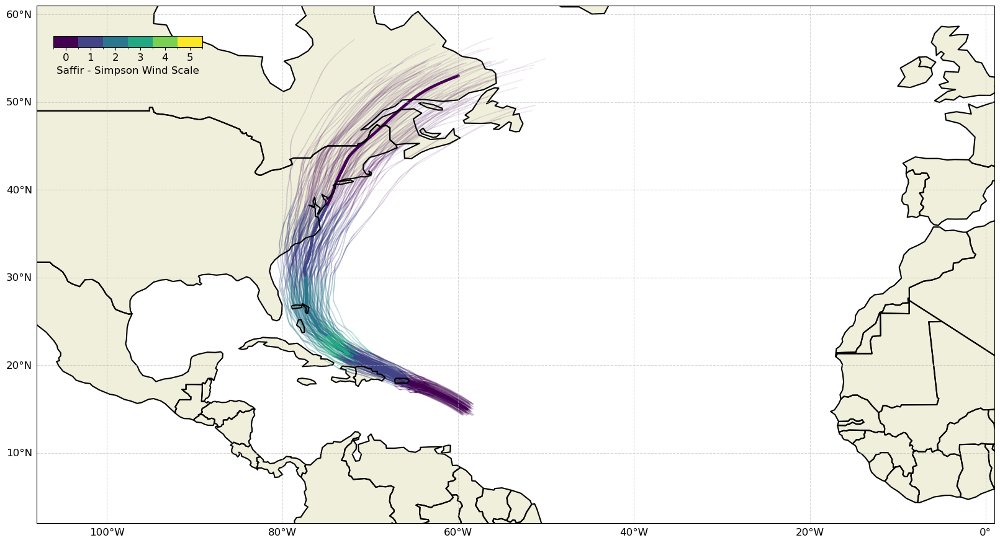

In [30]:
histStorm = 'IRENE'
dfhind = dctTracks[histStorm].resample('10min').interpolate(method = 'linear')
dfhind['cat'] = [ssScale(x/1.94384) for x in dfhind['max_sustained_wind'].values]

dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize = (16, 9), 
                       subplot_kw={'projection': ccrs.PlateCarree()}, 
                       constrained_layout=True)

dfworld.boundary.plot(ax = ax, color = 'k')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--') # show coordinates and grig
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cfeature.LAND)
# ax.add_feature(cfeature.LAKES)
# ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE,lw=0.25)


for i in range(1, 101):
    ax.scatter(dfhind[f'lon_pert{i:03d}'], dfhind[f'lat_pert{i:03d}'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 0.05, alpha = 0.2)


ax.scatter(dfhind['lon'], dfhind['lat'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 5, alpha = 1.0)

ax.set_xlim([-108, 1])
ax.set_ylim([2, 61])
ax.set_aspect('equal')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.set_aspect('equal')


fig = ax.get_figure()
cax = fig.add_axes([0.05, 0.89, 0.15, 0.02])
sm = plt.cm.ScalarMappable(cmap = cmap, norm = norm)
sm._A = []
cb = fig.colorbar(sm, cax = cax, label = 'Saffir - Simpson Wind Scale', orientation = 'horizontal')
loc = np.arange(0, 6, 1) + .5
cb.set_ticks(loc)
cb.set_ticklabels(np.arange(0, 6, 1))

fig.savefig(f'../documents/thesis/{histStorm}_perturbations.png', dpi = 300, bbox_inches = 'tight')

/tmp/ipykernel_36828/2815747778.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


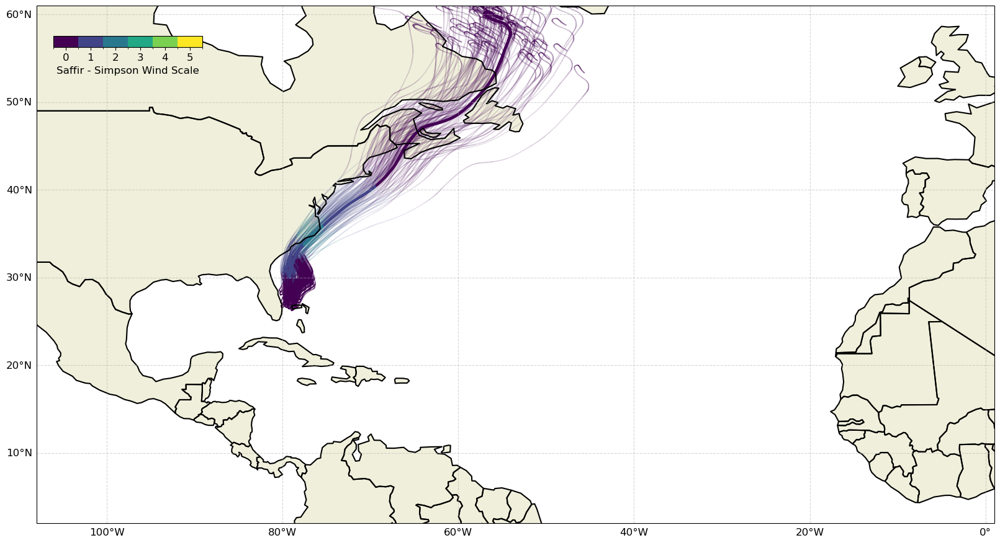

In [31]:
histStorm = 'ARTHUR'
dfhind = dctTracks[histStorm].resample('10min').interpolate(method = 'linear')
dfhind['cat'] = [ssScale(x/1.94384) for x in dfhind['max_sustained_wind'].values]

dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize = (16, 9), 
                       subplot_kw={'projection': ccrs.PlateCarree()}, 
                       constrained_layout=True)

dfworld.boundary.plot(ax = ax, color = 'k')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--') # show coordinates and grig
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cfeature.LAND)
# ax.add_feature(cfeature.LAKES)
# ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE,lw=0.25)


for i in range(1, 101):
    ax.scatter(dfhind[f'lon_pert{i:03d}'], dfhind[f'lat_pert{i:03d}'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 0.05, alpha = 0.2)


ax.scatter(dfhind['lon'], dfhind['lat'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 5, alpha = 1.0)

ax.set_xlim([-108, 1])
ax.set_ylim([2, 61])
ax.set_aspect('equal')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.set_aspect('equal')


fig = ax.get_figure()
cax = fig.add_axes([0.05, 0.89, 0.15, 0.02])
sm = plt.cm.ScalarMappable(cmap = cmap, norm = norm)
sm._A = []
cb = fig.colorbar(sm, cax = cax, label = 'Saffir - Simpson Wind Scale', orientation = 'horizontal')
loc = np.arange(0, 6, 1) + .5
cb.set_ticks(loc)
cb.set_ticklabels(np.arange(0, 6, 1))

fig.savefig(f'../documents/thesis/{histStorm}_perturbations.png', dpi = 300, bbox_inches = 'tight')

/tmp/ipykernel_36828/142356552.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


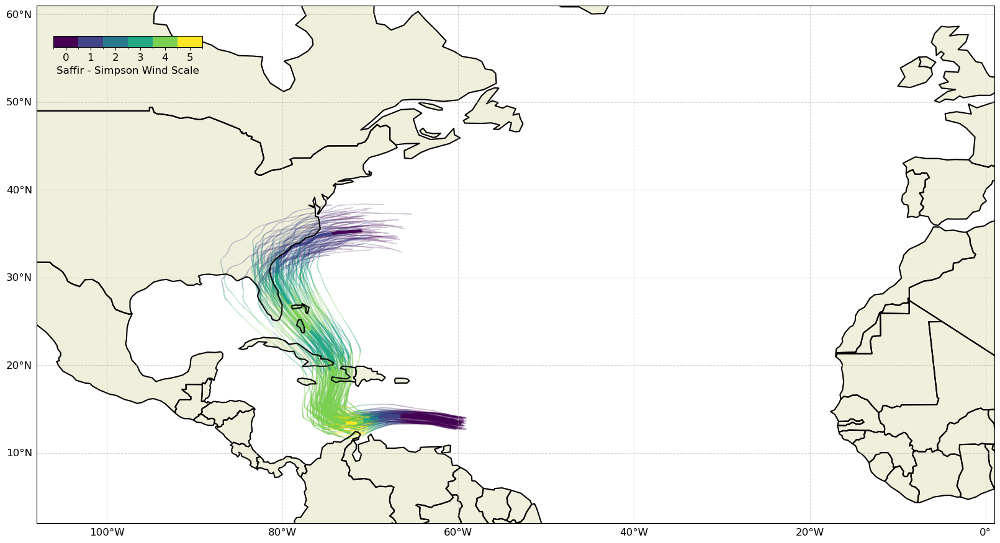

In [32]:
histStorm = 'MATTHEW'
dfhind = dctTracks[histStorm].resample('10min').interpolate(method = 'linear')
dfhind['cat'] = [ssScale(x/1.94384) for x in dfhind['max_sustained_wind'].values]

dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize = (16, 9), 
                       subplot_kw={'projection': ccrs.PlateCarree()}, 
                       constrained_layout=True)

dfworld.boundary.plot(ax = ax, color = 'k')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--') # show coordinates and grig
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cfeature.LAND)
# ax.add_feature(cfeature.LAKES)
# ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE,lw=0.25)


for i in range(1, 101):
    ax.scatter(dfhind[f'lon_pert{i:03d}'], dfhind[f'lat_pert{i:03d}'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 0.05, alpha = 0.2)


ax.scatter(dfhind['lon'], dfhind['lat'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 5, alpha = 1.0)

ax.set_xlim([-108, 1])
ax.set_ylim([2, 61])
ax.set_aspect('equal')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.set_aspect('equal')


fig = ax.get_figure()
cax = fig.add_axes([0.05, 0.89, 0.15, 0.02])
sm = plt.cm.ScalarMappable(cmap = cmap, norm = norm)
sm._A = []
cb = fig.colorbar(sm, cax = cax, label = 'Saffir - Simpson Wind Scale', orientation = 'horizontal')
loc = np.arange(0, 6, 1) + .5
cb.set_ticks(loc)
cb.set_ticklabels(np.arange(0, 6, 1))

fig.savefig(f'../documents/thesis/{histStorm}_perturbations.png', dpi = 300, bbox_inches = 'tight')

/tmp/ipykernel_36828/2998606216.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


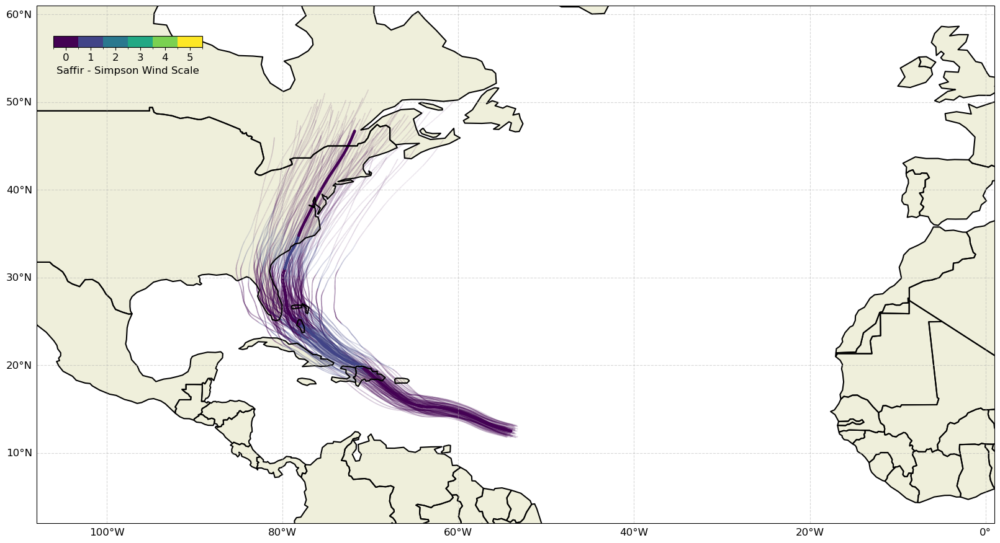

In [33]:
histStorm = 'ISAIAS'
dfhind = dctTracks[histStorm].resample('10min').interpolate(method = 'linear')
dfhind['cat'] = [ssScale(x/1.94384) for x in dfhind['max_sustained_wind'].values]

dfworld = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize = (16, 9), 
                       subplot_kw={'projection': ccrs.PlateCarree()}, 
                       constrained_layout=True)

dfworld.boundary.plot(ax = ax, color = 'k')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--') # show coordinates and grig
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cfeature.LAND)
# ax.add_feature(cfeature.LAKES)
# ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE,lw=0.25)


for i in range(1, 101):
    ax.scatter(dfhind[f'lon_pert{i:03d}'], dfhind[f'lat_pert{i:03d}'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 0.05, alpha = 0.2)


ax.scatter(dfhind['lon'], dfhind['lat'], c = dfhind['cat'], 
                 cmap = cmap, norm = norm, s = 5, alpha = 1.0)

ax.set_xlim([-108, 1])
ax.set_ylim([2, 61])
ax.set_aspect('equal')
ax.set_xlabel('Longitude [deg]')
ax.set_ylabel('Latitude [deg]')
ax.set_aspect('equal')


fig = ax.get_figure()
cax = fig.add_axes([0.05, 0.89, 0.15, 0.02])
sm = plt.cm.ScalarMappable(cmap = cmap, norm = norm)
sm._A = []
cb = fig.colorbar(sm, cax = cax, label = 'Saffir - Simpson Wind Scale', orientation = 'horizontal')
loc = np.arange(0, 6, 1) + .5
cb.set_ticks(loc)
cb.set_ticklabels(np.arange(0, 6, 1))

fig.savefig(f'../documents/thesis/{histStorm}_perturbations.png', dpi = 300, bbox_inches = 'tight')

In [35]:
dctF22 = pd.read_pickle(r'../models/adcirc/concorde/batch02/_postprocessing/_preprocessForNN/dct_tracksAll_batch02_ALL_lengthCorr_tides_resampled.pkl')

In [36]:
def stormDir(df):
    ''' direction going to as currents
    '''
    x = (df.loc[:, 'lon'].shift(1) - df.loc[:, 'lon']).values
    y = (df.loc[:, 'lat'].shift(1) - df.loc[:, 'lat']).values
    d = np.arctan2(x, y)
    d2 = np.rad2deg(d)
    d2 = np.mod(d2, 360)

    return d2

def forwardSpeed(df):
    '''
    '''
    vellist = [np.nan] 
    for i, j in zip(df.index[:-1], df.index[1:]):
        p1 = (df.loc[i, 'lat'], df.loc[i, 'lon'])
        p2 = (df.loc[j, 'lat'], df.loc[j, 'lon'])
        dist = geopy.distance.geodesic(p2, p1).km
        vel = dist/1 ##km/hr, time step is 3hr
        vellist.append(vel)
    
    return vellist

def dist2NC(y, x, pnt):
    return geopy.distance.geodesic(pnt, (y, x)).km

In [37]:
ys = [36.183, 35.795, 35.209, 34.717, 34.227, 34.213, 35.98, 35.49, 35.09]
xs = [-75.745, -75.549, -75.704, -76.67, -77.953, -77.787, -76.62, -77.0, -77.02]
names = ['Duck', 'Oregon', 'Hatteras', 'Beaufort', 'Wilmington', 'Wrightsville', 'Albemarle', 'Pamlico', 'Neuse']

In [38]:
path = Path(r'../data/tracks/climada')
with open(path/'tracksNC_with100perturbations.pkl', 'rb') as handle:
    dctTracks = pickle.load(handle)

In [39]:
## Read individual files and compute extra parameters
dctReal = {}
for k in dctTracks.keys():
    
    dfReal = dctTracks[k][['lon', 'lat', 'max_sustained_wind', 'central_pressure', 'radius_max_wind']]
    dfReal['heading_dir'] = stormDir(dfReal)
    dfReal['forward_speed'] = forwardSpeed(dfReal)

    for ntg, xtg, ytg in zip(names, xs, ys):
        d = [dist2NC(ytg, xtg, (y, x)) for x, y in zip(dfReal['lon'], dfReal['lat'])]
        dfReal[f'dist_to_{ntg}'] = d
    
    dctReal[k] = dfReal

/tmp/ipykernel_10000/1911989766.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfReal['heading_dir'] = stormDir(dfReal)
/tmp/ipykernel_10000/1911989766.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfReal['forward_speed'] = forwardSpeed(dfReal)
/tmp/ipykernel_10000/1911989766.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

In [40]:
varsY = 'wind_speed'
varsX = ['pressure', 'rad_to_max_ws', 'forward_speed']

y0, y1 = [], []
x00, x10, x20 = [], [], []
x01, x11, x21 = [], [], []

for k in dctF22.keys():
    df = dctF22[k]
    y0.append(df['wind_speed'].max())
    iX = df['wind_speed'].idxmax()
    x00.append(df.loc[iX, varsX[0]])
    x10.append(df.loc[iX, varsX[1]])
    x20.append(df.loc[iX, varsX[2]])

    names2 = ['duck', 'oregon', 'hatteras', 'beaufort', 'wilmington', 'wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    dfdummy = df.loc[:, [f'dist_to_{x}' for x in names2]]
    minDistIx = df.loc[:, dfdummy.min().idxmin()].idxmin()
    y1.append(df.loc[minDistIx, 'wind_speed'])
    x01.append(df.loc[minDistIx, varsX[0]])
    x11.append(df.loc[minDistIx, varsX[1]])
    x21.append(df.loc[minDistIx, varsX[2]])

In [41]:
varsY = 'max_sustained_wind'
varsX = ['central_pressure', 'radius_max_wind', 'forward_speed']

y0r, y1r = [], []
x00r, x10r, x20r = [], [], []
x01r, x11r, x21r = [], [], []

for k in list(dctReal.keys())[1:]:
    df = dctReal[k]
    y0r.append(df['max_sustained_wind'].max()*0.514444)
    iX = df['max_sustained_wind'].idxmax()
    x00r.append(df.loc[iX, varsX[0]])
    x10r.append(df.loc[iX, varsX[1]])
    x20r.append(df.loc[iX, varsX[2]])

    # names2 = ['duck', 'oregon', 'hatteras', 'beaufort', 'wilmington', 'wrightsville', 'Albemarle', 'Pamlico', 'Neuse']
    dfdummy = df.loc[:, [f'dist_to_{x}' for x in names]]
    minDistIx = df.loc[:, dfdummy.min().idxmin()].idxmin()
    y1r.append(df.loc[minDistIx, 'max_sustained_wind']*0.514444)
    x01r.append(df.loc[minDistIx, varsX[0]])
    x11r.append(df.loc[minDistIx, varsX[1]])
    x21r.append(df.loc[minDistIx, varsX[2]])

In [42]:
storms = ['Irene (2011)', 'Arthur (2014)', 'Matthew (2016)', 'Florence (2018)', 'Dorian (2019)', 'Isaias (2020)']

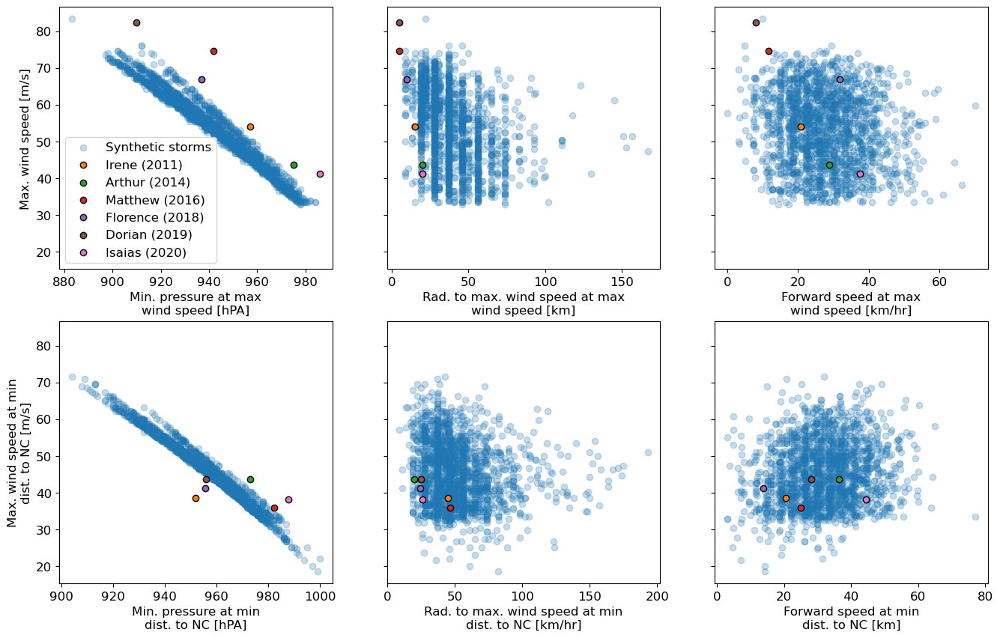

In [44]:
xlabels = ['Min. pressure at max\nwind speed [hPA]', 'Rad. to max. wind speed at max\nwind speed [km]', 'Forward speed at max\nwind speed [km/hr]', 'Min. pressure at min\ndist. to NC [hPA]', 'Rad. to max. wind speed at min\ndist. to NC [km/hr]', 'Forward speed at min\ndist. to NC [km]']
xs = [x00, x10, x20, x01, x11, x21]
ys = [y0, y0, y0, y1, y1, y1]

xsr = [x00r, x10r, x20r, x01r, x11r, x21r]
ysr = [y0r, y0r, y0r, y1r, y1r, y1r]

fig, ax = plt.subplots(figsize = (16, 10), ncols = 3, nrows = 2, sharey = True)

for i in range(6):
    axi = ax.flatten()[i]
    axi.scatter(xs[i], ys[i], color = ccolors[0], alpha = 0.25, label = 'Synthetic storms')

    for j in range(len(x21r)):
        axi.scatter([xsr[i][j]], [ysr[i][j]], color = ccolors[j+1], edgecolors='k', label = storms[j])
    
    if i == 0:
        axi.set_ylabel('Max. wind speed [m/s]')
    elif i == 3:
        axi.set_ylabel('Max. wind speed at min\ndist. to NC [m/s]')
    
    axi.set_xlabel(xlabels[i])
ax[0,0].legend(frameon = True)

fig.savefig(r'../documents/thesis/track_parameters_comparisson.png', dpi = 300, bbox_inches = 'tight')

In [62]:
path = Path(r'../data/probabilisticPredictions')
dctTracks = pd.read_pickle(path/'tracksNC_with100perturbations_predTides.pkl')

In [79]:
dummyMax, dummyMin = [], []
for k in list(dctTracks.keys())[1:]:
    dummyMax.append(dctTracks[k].iloc[:, -6:].max().values)
    dummyMin.append(dctTracks[k].iloc[:, -6:].min().values)
dfPredMax = pd.DataFrame(dummyMax,
                         index = storms, 
                         columns = ['duck', 'oregon', 'hatteras', 'beaufort', 'wilmington', 'wrightsville'])
dfPredMin = pd.DataFrame(dummyMin,
                         index = storms, 
                         columns = ['duck', 'oregon', 'hatteras', 'beaufort', 'wilmington', 'wrightsville'])

In [82]:
dfPredMax.columns = [f'{x}_max' for x in dfPredMax.columns]
dfPredMin.columns = [f'{x}_min' for x in dfPredMin.columns]
dfPred = pd.concat([dfPredMax, dfPredMin], axis = 1)

In [83]:
dfPred

,duck_max,oregon_max,hatteras_max,beaufort_max,wilmington_max,wrightsville_max,duck_min,oregon_min,hatteras_min,beaufort_min,wilmington_min,wrightsville_min
Irene (2011),0.761,0.244,0.085,0.739,0.955,0.810,-0.587,-0.101,-0.059,-0.540,-0.760,-0.805
Arthur (2014),0.583,0.184,0.008,0.566,0.734,0.647,-0.550,-0.147,-0.127,-0.567,-0.723,-0.787
Matthew (2016),0.700,0.237,0.120,0.664,0.865,0.757,-0.407,-0.046,-0.034,-0.381,-0.543,-0.740
Florence (2018),0.838,0.296,0.140,0.798,1.037,0.868,-0.593,-0.074,-0.057,-0.563,-0.741,-0.829
Dorian (2019),0.857,0.289,0.125,0.815,1.052,0.871,-0.633,-0.101,-0.045,-0.593,-0.801,-0.844
Isaias (2020),0.693,0.251,0.073,0.694,0.903,0.783,-0.529,-0.103,-0.069,-0.544,-0.669,-0.819


In [85]:
pathin = Path(r'../models/adcirc/concorde/batch02/_postprocessing')
baseNOAA = pd.read_csv(pathin/'time_series_water_level_at_NOAA_NC_closest_baseSim.csv', index_col = 0, parse_dates = True)
baseNOAA = baseNOAA.tz_localize(None)
baseOregon = pd.read_csv(pathin/'time_series_water_level_at_NOAA_NC_closest_baseSim_newOregon.csv', index_col = 0, parse_dates = True)
baseOregon = baseOregon.tz_localize(None)
baseDom = pd.read_csv(pathin/'time_series_water_level_at_domCenter_baseSim.csv', index_col = 0, parse_dates = True)
baseDom = baseDom.tz_localize(None)

baseNOAA['Oregon'] = baseOregon['Oregon'].values

dfSim = pd.DataFrame({'max': baseNOAA.max().values,
                      'min': baseNOAA.min().values}, index = ['duck', 'oregon', 'hatteras', 'beaufort', 'wilmington', 'wrightsville'])

In [86]:
dfSim

,max,min
duck,1.036522,-0.891865
oregon,0.428300,-0.098249
hatteras,0.195453,-0.010464
beaufort,1.038405,-1.012415
wilmington,0.973116,-0.807258
wrightsville,1.249791,-1.146688


In [18]:
df = pd.read_csv(r'../data/hurricanes/cost_casualties.csv', index_col=0)

In [22]:
df.sort_values('casualties').tail()

,year,cost B,casualties
Hurricane,,,
Georges,1998,11.3,604
Long Island Express,1938,6.7,740
Katrina,2005,195.0,1836
Jeanne,2004,12.1,3037
Maria,2017,111.6,3059


In [23]:
yearly_sum = df.groupby('year').sum()
yearly_sum.describe().T

,count,mean,std,min,25%,50%,75%,max
cost B,34.0,42.226471,70.776393,3.4,7.825,12.3,50.325,328.6
casualties,34.0,409.117647,820.005461,7.0,52.000,96.0,343.750,3300.0


In [26]:
yearly_sum.sort_values('casualties').tail()

,cost B,casualties
year,,
1998,11.3,604
1938,6.7,740
2005,256.7,2096
2004,87.1,3246
2017,328.6,3300


In [30]:
df[df['year'] == 2017]

,year,cost B,casualties
Hurricane,,,
Harvey,2017,155.0,107
Maria,2017,111.6,3059
Irma,2017,62.0,134


In [12]:
yearly_sum.idxmax()

cost B        2017
casualties    2017
dtype: int64

In [17]:
yearly_sum.sort_index()

,cost B,casualties
year,,
1938,6.7,740
1944,6.1,400
1954,5.3,72
1955,9.6,184
1960,4.0,439
1965,13.8,81
1969,11.9,259
1970,7.4,28
1972,15.5,128


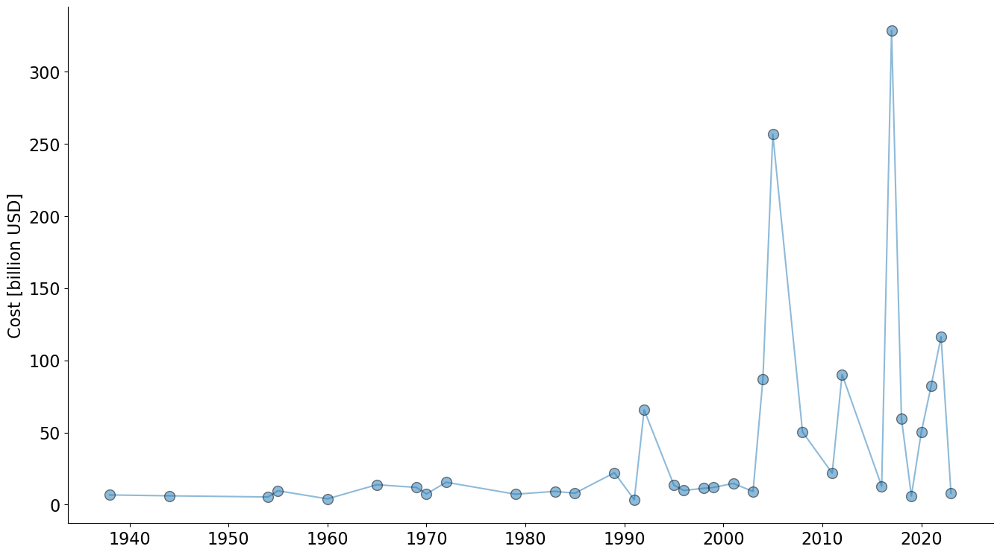

In [25]:
plt.rcParams.update({'font.size': 16})
fig, ax = plt.subplots(figsize = (16, 9))
yearly_sum['cost B'].plot(ax = ax, marker = 'o', ms = 10, alpha = 0.5, markeredgecolor = 'k')
ax.set_xticks(np.arange(1940, 2030, 10))
ax.set_ylabel('Cost [billion USD]')
ax.set_xlabel('')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
fig.savefig(r'../documents/defense/cost.png', dpi = 300, bbox_inches = 'tight')

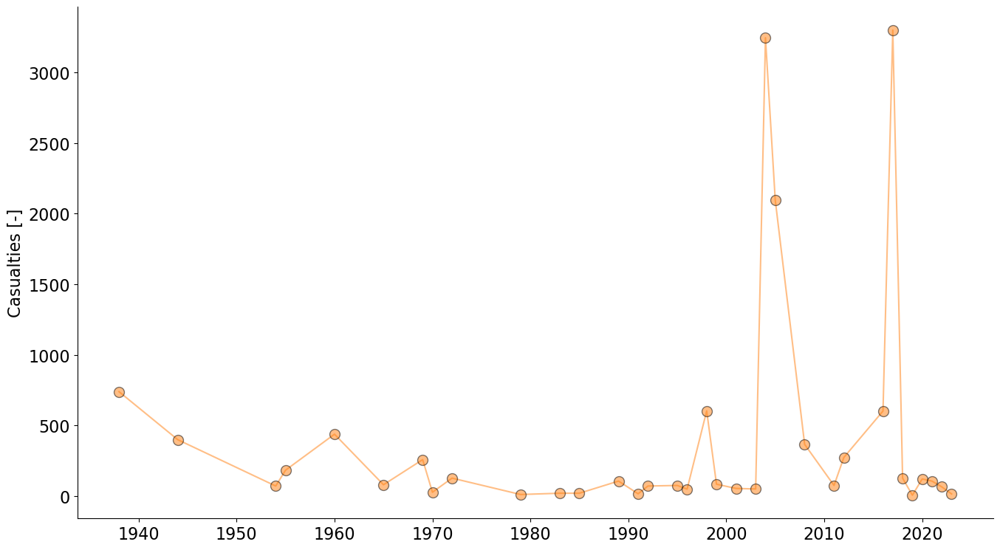

In [26]:
# plt.rcParams.update({'font.size': 16})
fig, ax = plt.subplots(figsize = (16, 9))
yearly_sum['casualties'].plot(ax = ax, marker = 'o', ms = 10, alpha = 0.5, markeredgecolor = 'k', color = ccolors[1])
ax.set_xticks(np.arange(1940, 2030, 10))
ax.set_ylabel('Casualties [-]')
ax.set_xlabel('')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
fig.savefig(r'../documents/defense/casualties.png', dpi = 300, bbox_inches = 'tight')

In [78]:
df1 = pd.DataFrame({'adcirc':[1.2], 'prob':[100*1.2], 'training':[0], 'pred': [0]})
df2 = pd.DataFrame({'adcirc':[0], 'prob':[0], 'training':[3.4], 'pred': [6/3600]})

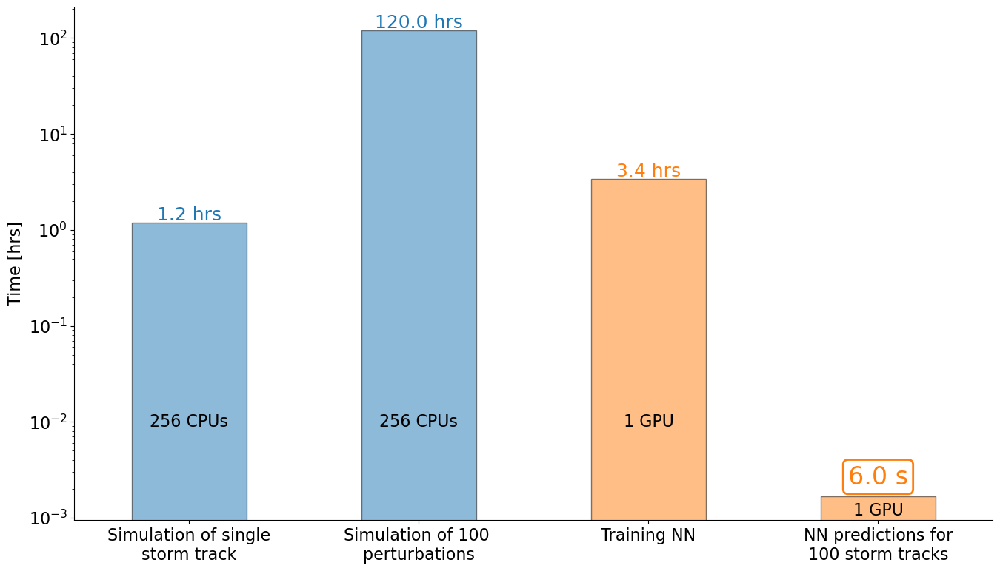

In [90]:
fig, ax = plt.subplots(figsize = (16, 9))
# ax.bar(df.iloc[])
df1.T.plot.bar(ax = ax, alpha = 0.5, edgecolor = 'k', label = '__nolegend__', legend = False)
df2.T.plot.bar(ax = ax, alpha = 0.5, edgecolor = 'k', label = '__nolegend__', legend = False, color=ccolors[1])
ax.set_yscale('log')
ax.set_ylabel('Time [hrs]')
ax.tick_params(labelrotation=0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticklabels(['Simulation of single\nstorm track', 'Simulation of 100 \nperturbations', 'Training NN', 'NN predictions for\n100 storm tracks'])

for icol, col in enumerate(df1.columns[:2]):
    ax.text(icol, 1.2*df1.loc[0, col], f'{df1.loc[0, col]:0.1f} hrs', fontsize=18,
            verticalalignment='center', horizontalalignment='center', color = ccolors[0])
ax.text(2, 1.2*df2.iloc[0, 2], f'{df2.iloc[0, 2]:0.1f} hrs', fontsize=18,
            verticalalignment='center', horizontalalignment='center', color = ccolors[1])
# props = dict(boxstyle='round',alpha = 1, color = ccolors[1], edgecolor = ccolors[1], facecolor = None)
ax.text(3, 1.6*df2.iloc[0, 3], f'{df2.iloc[0, 3]*3600:0.1f} s', fontsize=24, 
        bbox=dict(facecolor='none', edgecolor=ccolors[1], boxstyle='round,pad=0.2', linewidth=2),
            verticalalignment='center', horizontalalignment='center', color = ccolors[1])
ax.text(0, 10e-3, '256 CPUs', fontsize=16,
            verticalalignment='center', horizontalalignment='center', color = 'k')
ax.text(1, 10e-3, '256 CPUs', fontsize=16,
            verticalalignment='center', horizontalalignment='center', color = 'k')
ax.text(2, 10e-3, '1 GPU', fontsize=16,
            verticalalignment='center', horizontalalignment='center', color = 'k')
ax.text(3, 12e-4, '1 GPU', fontsize=16,
            verticalalignment='center', horizontalalignment='center', color = 'k')

fig.savefig(r'../documents/defense/barplots_runtimes2.png', dpi = 300, bbox_inches = 'tight')